# Moosic Project Using K means Clustering

---
## Challenge: apply K means to the spotify dataset 😃

## 1. Explore the 5000 songs dataset

Import the 10 songs dataset and explore it. Do you agree with the liveliness scores that certain songs have been given? Do you think the top 3 most danceable songs are the most danceable songs in the list? Ask questions of the data and see where it leads you.

If you're not familiar with any of the songs, look them up on YouTube or Spotify and listen to at least 30 seconds of each song to get a feel for them. Even if you're not a music expert we can all tell the difference between gangster rap and classical, right? Look at the scores given and see if they make sense with **how these songs make you feel**.

---
### 1.1 Import libraries and files 💾

In [ ]:
import pandas as pd
import numpy as np

# Import the model
from sklearn.cluster import KMeans

# To plot graph and visualize data
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

# Compute the distance matrix
from sklearn.metrics import pairwise_distances, silhouette_score

# Transform features by scaling
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, QuantileTransformer, PowerTransformer
from sklearn.decomposition import PCA
from sklearn.datasets import make_blobs

from sklearn import set_config
set_config(transform_output="pandas")

# To get analysis of entire data
#from ydata_profiling import ProfileReport

# For static plots
%matplotlib inline
# Or:
#%matplotlib notebook  # For interactive plots

# !pip install ydata_profiling
# !pip install ipywidgets

In [ ]:
# URL to get file from google drive
url = "https://drive.google.com/file/d/1nC789_00aZPgVNqzo_sOO6mZOKJncvkM/view?usp=sharing"

#spotify_10_songs.csv
path = "https://drive.google.com/uc?export=download&id="+url.split("/")[-2]

spotify_songs_df = pd.read_csv(path)

---
### 1.2. Manually Explore the data 👩‍🚀

In [ ]:
spotify_songs_df

,Unnamed: 0,name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,duration_ms,time_signature,id,html
0,0,Se Eu Quiser Falar Com Deus ...,Gilberto Gil,0.6580,0.25900,11,-13.141,0,0.0705,0.694,0.000059,0.9750,0.3060,110.376,,256213,4,1n7JnwviZ7zf0LR1tcGFq7,https://open.spotify.com/track/1n7JnwviZ7zf0LR...
1,1,Saudade De Bahia ...,Antônio Carlos Jobim,0.7420,0.39900,2,-12.646,1,0.0346,0.217,0.000002,0.1070,0.6930,125.039,,191867,4,5QGM1U0eCYrQuwSJwTm5Zq,https://open.spotify.com/track/5QGM1U0eCYrQuwS...
2,2,"Canta Canta, Minha Gente ...",Martinho Da Vila,0.8510,0.73000,2,-11.048,1,0.3470,0.453,0.000063,0.1240,0.9050,93.698,,152267,4,0NLIFSZxPzQhCwnkn5PJYs,https://open.spotify.com/track/0NLIFSZxPzQhCwn...
3,3,Mulher Eu Sei ...,Chico César,0.7050,0.05020,4,-18.115,1,0.0471,0.879,0.000041,0.3860,0.5240,106.802,,186227,4,3mXqOdlLE1k67WsAxryPFs,https://open.spotify.com/track/3mXqOdlLE1k67Ws...
4,4,Rosa Morena ...,Kurt Elling,0.6510,0.11900,6,-19.807,1,0.0380,0.916,0.000343,0.1040,0.4020,120.941,,273680,4,7bSzjzjTkWT2CkIPPdp0eA,https://open.spotify.com/track/7bSzjzjTkWT2CkI...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5230,5230,"1812 Festival Overture, Op. 49: 1812 Overture,...",Pyotr Ilyich Tchaikovsky,0.2020,0.06940,3,-23.390,1,0.0473,0.917,0.715000,0.0832,0.0655,87.906,,995000,4,1aEhYlZtypmipA06SDJ4U3,https://open.spotify.com/track/1aEhYlZtypmipA0...
5231,5231,"Winter Fragments pour ensemble instrumental, s...",Tristan Murail,0.1880,0.10100,6,-21.873,1,0.0442,0.855,0.426000,0.0694,0.0355,83.134,,855000,4,1Gfqe7TAKklmuZf6hxsH6h,https://open.spotify.com/track/1Gfqe7TAKklmuZf...
5232,5232,"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3...",Arnold Schoenberg,0.0596,0.00093,9,-42.959,1,0.0434,0.951,0.969000,0.0772,0.0344,71.573,,238187,3,2XNwnFrdMDpismp0VUZ7cU,https://open.spotify.com/track/2XNwnFrdMDpismp...
5233,5233,"Serenade For Strings In E, Op.22, B. 52: 1. Mo...",Antonín Dvořák,0.1330,0.02080,4,-29.443,1,0.0419,0.883,0.505000,0.1110,0.0591,67.109,,314307,4,7ucDwgMtE3YJtEfTbuRhy0,https://open.spotify.com/track/7ucDwgMtE3YJtEf...


In [ ]:
spotify_songs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5235 entries, 0 to 5234
Data columns (total 19 columns):
 #   Column                                                                                                                                                                             Non-Null Count  Dtype  
---  ------                                                                                                                                                                             --------------  -----  
 0   Unnamed: 0                                                                                                                                                                         5235 non-null   int64  
 1   name                                                                                                                                                                               5235 non-null   object 
 2   artist                                                  

In [ ]:
# Print the column names in the DataFrame
print(spotify_songs_df.columns)

Index(['Unnamed: 0',
       'name                                                                                                                                                                             ',
       'artist                                          ', 'danceability ',
       'energy   ', 'key ', 'loudness ', 'mode ', 'speechiness ',
       'acousticness ', 'instrumentalness ', 'liveness ', 'valence ',
       'tempo   ', 'type ', 'duration_ms ', 'time_signature ',
       'id                     ', 'html'],
      dtype='object')


In [ ]:
# Strip for Leading/Trailing Spaces
spotify_songs_df.columns = spotify_songs_df.columns.str.strip()

In [ ]:
# Print the column names in the DataFrame
print(spotify_songs_df["name"])

0       Se Eu Quiser Falar Com Deus                   ...
1       Saudade De Bahia                              ...
2       Canta Canta, Minha Gente                      ...
3       Mulher Eu Sei                                 ...
4       Rosa Morena                                   ...
                              ...                        
5230    1812 Festival Overture, Op. 49: 1812 Overture,...
5231    Winter Fragments pour ensemble instrumental, s...
5232    Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3...
5233    Serenade For Strings In E, Op.22, B. 52: 1. Mo...
5234    Ravel: Boléro, M. 81                          ...
Name: name, Length: 5235, dtype: object


In [ ]:
spotify_songs_df["name"] = spotify_songs_df["name"].str.strip()

In [ ]:
spotify_songs_df_copy = spotify_songs_df.copy()

In [ ]:
# Combined song_name and artist in one column
spotify_songs_df_copy["song_name_&_artist"] = spotify_songs_df_copy["name"] + "-" + spotify_songs_df_copy["artist"]

In [ ]:
# Print the column names in the DataFrame
print(spotify_songs_df_copy["song_name_&_artist"])

0       Se Eu Quiser Falar Com Deus-Gilberto Gil      ...
1       Saudade De Bahia-Antônio Carlos Jobim         ...
2       Canta Canta, Minha Gente-Martinho Da Vila     ...
3       Mulher Eu Sei-Chico César                     ...
4       Rosa Morena-Kurt Elling                       ...
                              ...                        
5230    1812 Festival Overture, Op. 49: 1812 Overture,...
5231    Winter Fragments pour ensemble instrumental, s...
5232    Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3...
5233    Serenade For Strings In E, Op.22, B. 52: 1. Mo...
5234    Ravel: Boléro, M. 81-Maurice Ravel            ...
Name: song_name_&_artist, Length: 5235, dtype: object


In [ ]:
spotify_songs_df_copy = spotify_songs_df_copy.set_index("song_name_&_artist")

In [ ]:
spotify_songs_df_copy.head(4)

,Unnamed: 0,name,artist,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,duration_ms,time_signature,id,html
song_name_&_artist,,,,,,,,,,,,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0,Se Eu Quiser Falar Com Deus,Gilberto Gil,0.658,0.2590,11,-13.141,0,0.0705,0.694,0.000059,0.975,0.306,110.376,,256213,4,1n7JnwviZ7zf0LR1tcGFq7,https://open.spotify.com/track/1n7JnwviZ7zf0LR...
Saudade De Bahia-Antônio Carlos Jobim,1,Saudade De Bahia,Antônio Carlos Jobim,0.742,0.3990,2,-12.646,1,0.0346,0.217,0.000002,0.107,0.693,125.039,,191867,4,5QGM1U0eCYrQuwSJwTm5Zq,https://open.spotify.com/track/5QGM1U0eCYrQuwS...
"Canta Canta, Minha Gente-Martinho Da Vila",2,"Canta Canta, Minha Gente",Martinho Da Vila,0.851,0.7300,2,-11.048,1,0.3470,0.453,0.000063,0.124,0.905,93.698,,152267,4,0NLIFSZxPzQhCwnkn5PJYs,https://open.spotify.com/track/0NLIFSZxPzQhCwn...
Mulher Eu Sei-Chico César,3,Mulher Eu Sei,Chico César,0.705,0.0502,4,-18.115,1,0.0471,0.879,0.000041,0.386,0.524,106.802,,186227,4,3mXqOdlLE1k67WsAxryPFs,https://open.spotify.com/track/3mXqOdlLE1k67Ws...


In [ ]:
# Drop uneccesarry columns
to_drop = ['Unnamed: 0','name', 'artist', 'id','html', 'key','acousticness','liveness','type','duration_ms', 'time_signature']
spotify_songs_df_copy = spotify_songs_df_copy.drop(columns = to_drop)
spotify_songs_df_copy.head(3)

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0.658,0.259,-13.141,0,0.0705,0.000059,0.306,110.376
Saudade De Bahia-Antônio Carlos Jobim,0.742,0.399,-12.646,1,0.0346,0.000002,0.693,125.039
"Canta Canta, Minha Gente-Martinho Da Vila",0.851,0.730,-11.048,1,0.3470,0.000063,0.905,93.698


In [ ]:
spotify_songs_df_copy.duplicated().value_counts()

,count
False,5158
True,77


In [ ]:
spotify_songs_df_copy[spotify_songs_df_copy.duplicated(keep=False)]

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0.658,0.259,-13.141,0,0.0705,0.000059,0.306,110.376
The Girl From Ipanema-Stan Getz,0.641,0.140,-16.790,1,0.0390,0.001660,0.388,129.318
Já Sei Namorar - 2004 Digital Remaster-Tribalistas,0.670,0.822,-6.687,0,0.0570,0.001150,0.833,145.560
Berekerê - Voice-Geraldo Azevedo,0.434,0.573,-11.203,0,0.0666,0.000000,0.786,172.189
Já Sei Namorar - 2004 Digital Remaster-Tribalistas,0.670,0.822,-6.687,0,0.0570,0.001150,0.833,145.560
...,...,...,...,...,...,...,...,...
Unquestionable Presence-Atheist,0.221,0.892,-9.829,1,0.0743,0.644000,0.365,90.733
Unquestionable Presence-Atheist,0.221,0.892,-9.829,1,0.0743,0.644000,0.365,90.733
Favorite (Vampire)-NCT 127,0.561,0.758,-3.870,0,0.0478,0.000003,0.178,149.944


In [ ]:
spotify_songs_df_copy.drop_duplicates(inplace=True)

In [ ]:
spotify_songs_df_copy.duplicated().value_counts()

,count
False,5158


In [ ]:
spotify_songs_df_copy.describe()

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
count,5158.000000,5158.000000,5158.000000,5158.000000,5158.000000,5158.000000,5158.000000,5158.000000
mean,0.507419,0.653213,-9.381994,0.647538,0.083147,0.260690,0.442103,118.665838
std,0.218173,0.289580,6.318703,0.477783,0.070999,0.371995,0.278038,28.607044
min,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.306000,0.475000,-11.387750,0.000000,0.038900,0.000001,0.195000,96.076750
50%,0.536000,0.738000,-7.362500,1.000000,0.055700,0.002235,0.414000,119.011500
75%,0.686000,0.895000,-5.303000,1.000000,0.098800,0.658000,0.676000,134.060000
max,0.967000,1.000000,1.342000,1.000000,0.918000,0.985000,0.985000,213.990000


### Use ydata_profiling - To automatically exploring data

In [ ]:
#report = ProfileReport(spotify_songs_df_copy)
#report

---
### 1.3 Scalers - changing the range, but not the distribution 🎚️
When we scale with SKLearn we get the choice to use a variety of scalers. Scalers do not change the distribution of the data, they change the range of the data.

> **Remember:** Range = Max - Min

#### 1.3.1 Min and Max Scaling
All columns get scaled between 0 and 1. The lowest value of a column becomes 0, the highest value of a column becomes 1, and all other values get scaled in between.
<br>
<br>
\begin{align}
newValue = \frac{oldValue - min(column)}{max(column) - min(column)}
    \end{align}
<br>
Let's apply Min Max scaling to the whole DataFrame:

In [ ]:
# Create a MinMaxScaler object
scaler_minmax = MinMaxScaler().set_output(transform="pandas") # If you want to explore set_output further https://blog.scikit-learn.org/technical/pandas-dataframe-output-for-sklearn-transformer/

# Scale the spotify_songs_df_copy DataFrame
spotify_songs_minmax = scaler_minmax.fit_transform(spotify_songs_df_copy)

In [ ]:
spotify_songs_minmax

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0.680455,0.25900,0.763897,0.0,0.076797,0.000060,0.310660,0.515800
Saudade De Bahia-Antônio Carlos Jobim,0.767322,0.39900,0.771967,1.0,0.037691,0.000002,0.703553,0.584322
"Canta Canta, Minha Gente-Martinho Da Vila",0.880041,0.73000,0.798018,1.0,0.377996,0.000064,0.918782,0.437862
Mulher Eu Sei-Chico César,0.729059,0.05020,0.682811,1.0,0.051307,0.000041,0.531980,0.499098
Rosa Morena-Kurt Elling,0.673216,0.11900,0.655228,1.0,0.041394,0.000348,0.408122,0.565171
...,...,...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",0.208893,0.06940,0.596818,1.0,0.051525,0.725888,0.066497,0.410795
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",0.194416,0.10100,0.621548,1.0,0.048148,0.432487,0.036041,0.388495
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.061634,0.00093,0.277803,1.0,0.047277,0.983756,0.034924,0.334469


To exemplify the effects of Min-Max scaling, let's compare the original values of the age column to the scaled values.

In [ ]:
# Display age column of original DataFrame and age column of MinMaxed DataFrame to compare
pd.DataFrame({
    'original': spotify_songs_df_copy.iloc[:,1],
    'min_max_scale': spotify_songs_minmax.iloc[:,1]
}).sort_values(by='original')

,original,min_max_scale
song_name_&_artist,,
Shake It Off-Taylor Swift,0.000000,0.000000
Track3a (2waynice)-Keith Fullerton Whitman,0.000020,0.000020
"Deborah's Theme (From ""Once upon a Time in America"")-Ennio Morricone",0.000436,0.000436
"Handel Sarabande Variation (Arr. for Piano from Sarabande, HWV 437)-George Frideric Handel",0.000791,0.000791
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.000930,0.000930
...,...,...
Armies Of The Dead-Post Mortem,0.999000,0.999000
Ich bin ein Döner - Single Version-Tim Toupet,0.999000,0.999000
Supa Deutschland - Medley-Mickie Krause,0.999000,0.999000


If we plot the original and MinMax-scaled ages below, we can see that MinMax scaling only affects the range of the data on the x-axis, not the shape of the distribution.

kde - kernel distribution estimation i.e. smooth curve over histogram

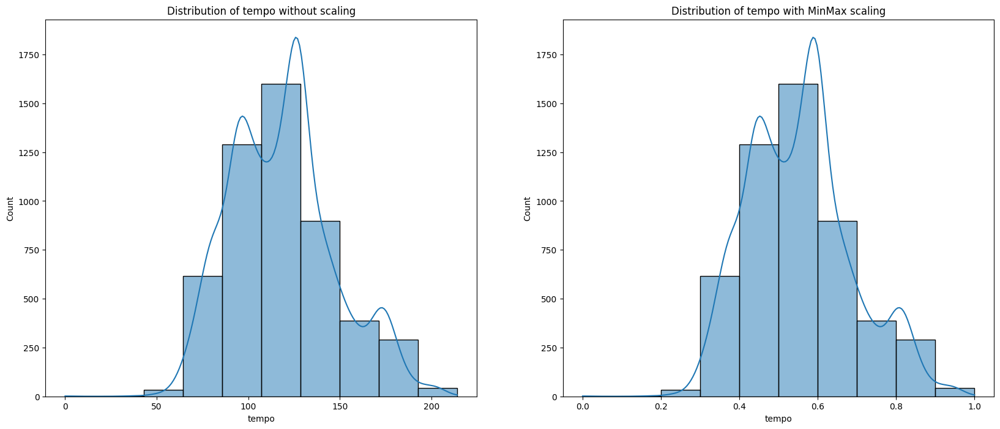

In [ ]:
# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the two plots
sns.histplot(data=spotify_songs_df_copy.iloc[:,-1], bins=10, kde=True, ax=ax1);
sns.histplot(spotify_songs_minmax.iloc[:,-1], bins=10, kde=True, ax=ax2);

# Adding titles to the plots
ax1.set_title('Distribution of tempo without scaling')
ax2.set_title('Distribution of tempo with MinMax scaling')

plt.show()

Let's have a look at the affect MinMax scaling had on the heatmap

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_minmax_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_minmax),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)
spotify_songs_minmax_distances_df

song_name_&_artist,Se Eu Quiser Falar Com Deus-Gilberto Gil,Saudade De Bahia-Antônio Carlos Jobim,"Canta Canta, Minha Gente-Martinho Da Vila",Mulher Eu Sei-Chico César,Rosa Morena-Kurt Elling,Desafinado-Stan Getz,Madalena-Maria Gasolina,O Meu Amor É Glòria-Sílvia Pérez Cruz,Brigas Nunca Mais-Paula Morelenbaum,Previsao-Bossacucanova,...,"Symphony No. 3 - ""Chant de la nuit"", Op. 27: Largo...-Karol Szymanowski","Pines Of Rome, P. 141: 3. The Pines Of The Janiculum-Ottorino Respighi","Don Giovanni, K.527: Overture-Wolfgang Amadeus Mozart","Music for Strings, Percussion and Celesta, BB 114: II. Allegro-Béla Bartók",A Flock Descends Into The Pentagonal Garden-Toru Takemitsu,"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky","Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail","Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg","Serenade For Strings In E, Op.22, B. 52: 1. Moderato-Antonín Dvořák","Ravel: Boléro, M. 81-Maurice Ravel"
song_name_&_artist,,,,,,,,,,,,,,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,2.107342e-08,1.089863,1.315084e+00,1.049974,1.022082,1.057777,0.577504,1.312577,1.133555,1.250428,...,1.192996,1.509515,1.366152,1.006157,1.011041,1.372713,1.249359,1.662308e+00,1.337758,1.212641
Saudade De Bahia-Antônio Carlos Jobim,1.089863e+00,0.000000,5.536486e-01,0.409830,0.434217,0.509273,1.113965,0.615025,0.278271,0.631024,...,0.973001,1.361650,1.054383,1.502135,1.619303,1.189205,1.053910,1.542080e+00,1.168333,0.918429
"Canta Canta, Minha Gente-Martinho Da Vila",1.315084e+00,0.553649,4.214685e-08,0.870797,0.909268,0.960092,1.279517,0.362560,0.614104,0.663616,...,1.321675,1.674606,1.350351,1.736853,1.871878,1.512560,1.405106,1.827807e+00,1.506781,1.262164
Mulher Eu Sei-Chico César,1.049974e+00,0.409830,8.707970e-01,0.000000,0.168575,0.366221,1.112371,0.894439,0.604293,0.907726,...,0.820184,1.188216,0.978709,1.434486,1.481575,1.014722,0.858712,1.361541e+00,0.951250,0.707082
Rosa Morena-Kurt Elling,1.022082e+00,0.434217,9.092680e-01,0.168575,0.000000,0.273694,1.137077,0.907008,0.565919,0.867614,...,0.702201,1.116571,0.931008,1.400277,1.428394,0.942612,0.766262,1.300019e+00,0.876502,0.663196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",1.372713e+00,1.189205,1.512560e+00,1.014722,0.942612,0.782372,1.330770,1.393363,1.197272,1.138259,...,0.703221,0.214562,0.436195,1.100996,1.021486,0.000000,0.298898,4.488657e-01,0.268637,0.359668
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",1.249359e+00,1.053910,1.405106e+00,0.858712,0.766262,0.631861,1.310800,1.271546,1.081555,1.074862,...,0.414227,0.473025,0.620309,1.204367,1.040854,0.298898,0.000000,6.727733e-01,0.193693,0.307283
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",1.662308e+00,1.542080,1.827807e+00,1.361541,1.300019,1.149687,1.560834,1.701134,1.550551,1.461398,...,1.041240,0.263200,0.722358,1.196609,1.092637,0.448866,0.672773,2.980232e-08,0.526949,0.691312


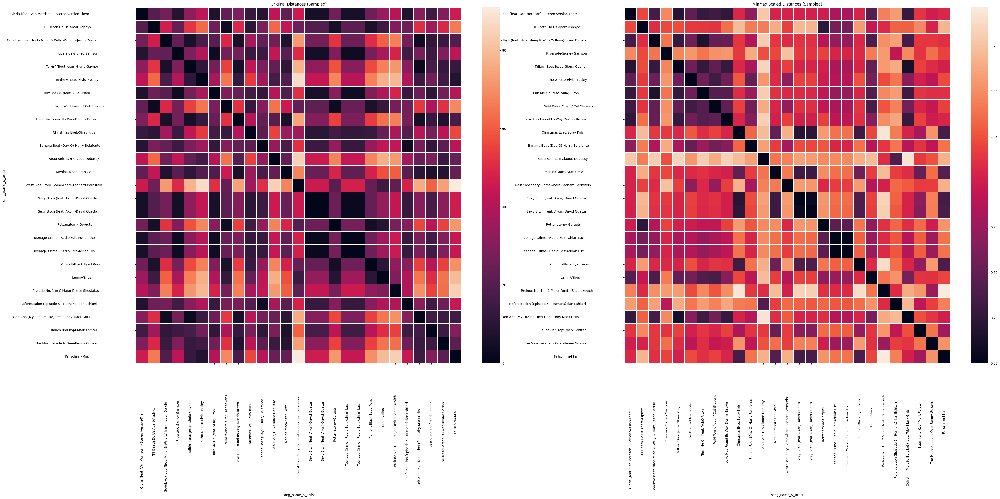

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_minmax_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_minmax),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)

# Making the DataFrame for the original heatmap
spotify_songs_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_df_copy),
                                     index=spotify_songs_df_copy.index,
                                     columns=spotify_songs_df_copy.index)


sample_indices = spotify_songs_df_copy.index.to_series().sample(25, random_state=42)
spotify_songs_minmax_distances_sample_df = spotify_songs_minmax_distances_df.loc[sample_indices, sample_indices]
spotify_songs_distances_sample_df = spotify_songs_distances_df.loc[sample_indices, sample_indices]

# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(50, 20))

# Plotting the two plots
sns.heatmap(spotify_songs_distances_sample_df, ax=ax1, linewidths=.2);
sns.heatmap(spotify_songs_minmax_distances_sample_df, ax=ax2, linewidths=.2);

# Adding titles to the plots
ax1.set_title('Original Distances (Sampled)')
ax2.set_title('MinMax Scaled Distances (Sampled)')

plt.show()

By scaling all features between 0 and 1, we prevent any feature with a much larger scale from having a much larger impact on our final output.

#### 3.2.&nbsp; Standard scaler

The StandardScaler scales all features according to the standard deviation of the feature. The standard deviation is equal to 1, and all other values are scaled accordingly. The data is also centered around 0, meaning that the mean becomes 0 and all values less than the mean are negative, while all values higher than the mean are positive.

\begin{align}
newValue = \frac{oldValue - mean(column)}{std(column)}
    \end{align}

Let's apply this to the whole DataFrame:

In [ ]:
# Create a StandardScaler object
scaler_standard = StandardScaler().set_output(transform="pandas")

# Scale the foods_df DataFrame
spotify_songs_standard = scaler_standard.fit_transform(spotify_songs_df_copy)

In [ ]:
spotify_songs_standard

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0.690257,-1.361458,-0.594959,-1.355428,-0.178150,-0.700698,-0.489558,-0.289811
Saudade De Bahia-Antônio Carlos Jobim,1.075310,-0.877953,-0.516613,0.737775,-0.683843,-0.700850,0.902472,0.222805
"Canta Canta, Minha Gente-Martinho Da Vila",1.574963,0.265192,-0.263688,0.737775,3.716670,-0.700685,1.665032,-0.872871
Mulher Eu Sei-Chico César,0.905703,-2.082572,-1.382222,0.737775,-0.507766,-0.700747,0.294583,-0.414758
Rosa Morena-Kurt Elling,0.658169,-1.844964,-1.650025,0.737775,-0.635950,-0.699933,-0.144248,0.079539
...,...,...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",-1.400033,-2.016263,-2.217127,0.737775,-0.504949,1.221398,-1.354632,-1.075358
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",-1.464208,-1.907129,-1.977022,0.737775,-0.548616,0.444431,-1.462541,-1.242186
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",-2.052790,-2.252732,-5.314423,0.737775,-0.559885,1.904269,-1.466498,-1.646357


To exemplify the effects of Standard scaling, let's compare the original values of the age column to the scaled values.

In [ ]:
# Display age column of original DataFrame and age column of MinMaxed DataFrame to compare
pd.DataFrame({
    'original': spotify_songs_df_copy.iloc[:,1],
    'standard_scale': spotify_songs_standard.iloc[:,1]
}).sort_values(by='original')

,original,standard_scale
song_name_&_artist,,
Shake It Off-Taylor Swift,0.000000,-2.255944
Track3a (2waynice)-Keith Fullerton Whitman,0.000020,-2.255874
"Deborah's Theme (From ""Once upon a Time in America"")-Ennio Morricone",0.000436,-2.254438
"Handel Sarabande Variation (Arr. for Piano from Sarabande, HWV 437)-George Frideric Handel",0.000791,-2.253212
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.000930,-2.252732
...,...,...
Armies Of The Dead-Post Mortem,0.999000,1.194213
Ich bin ein Döner - Single Version-Tim Toupet,0.999000,1.194213
Supa Deutschland - Medley-Mickie Krause,0.999000,1.194213


If we plot the original and Standard-scaled ages below, we can see that Standard scaling only affects the range of the data on the x-axis, not the shape of the distribution.

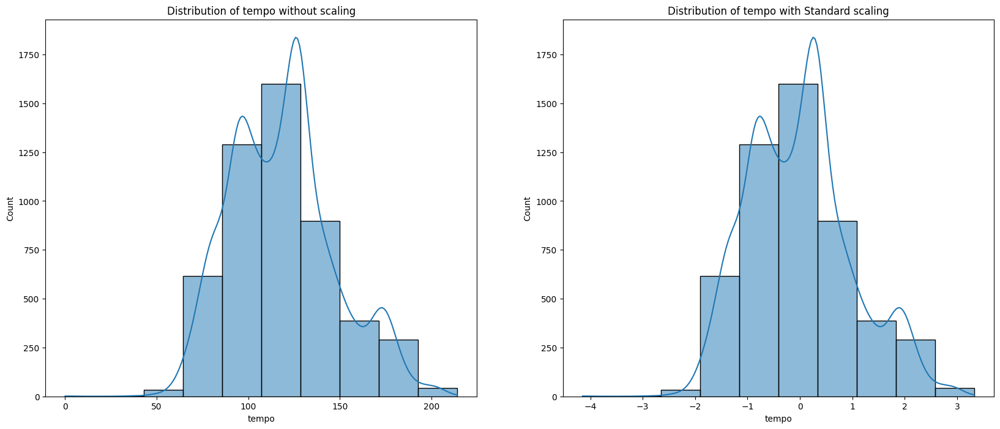

In [ ]:
# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the two plots
sns.histplot(data=spotify_songs_df_copy.iloc[:,-1], bins=10, kde=True, ax=ax1);
sns.histplot(spotify_songs_standard.iloc[:,-1], bins=10, kde=True, ax=ax2);

# Adding titles to the plots
ax1.set_title('Distribution of tempo without scaling')
ax2.set_title('Distribution of tempo with Standard scaling')

plt.show()

Let's have a look at the affect Standard scaling had on the heatmap

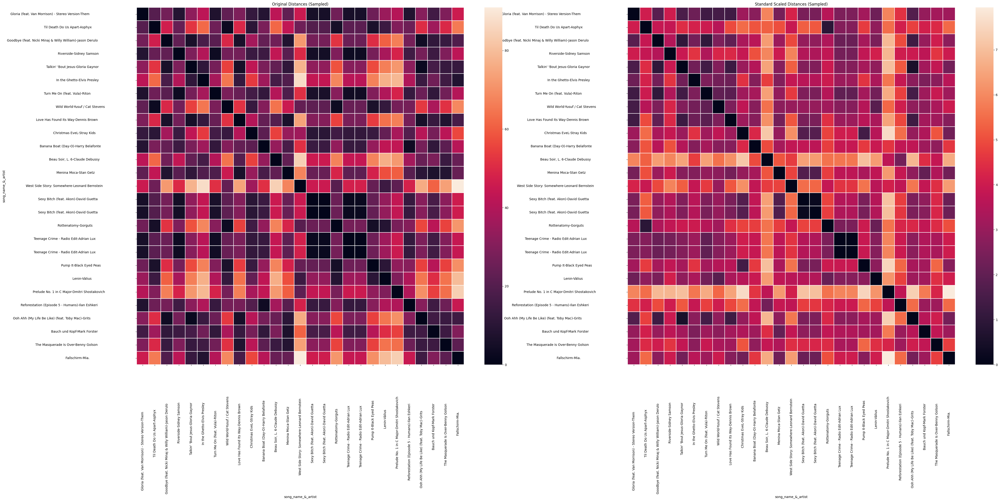

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_standard_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_standard),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)

# Making the DataFrame for the original heatmap
spotify_songs_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_df_copy),
                                     index=spotify_songs_df_copy.index,
                                     columns=spotify_songs_df_copy.index)


sample_indices = spotify_songs_df_copy.index.to_series().sample(25, random_state=42)
spotify_songs_standard_distances_sample_df = spotify_songs_standard_distances_df.loc[sample_indices, sample_indices]
spotify_songs_distances_sample_df = spotify_songs_distances_df.loc[sample_indices, sample_indices]

# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(50, 20))

# Plotting the two plots
sns.heatmap(spotify_songs_distances_sample_df, ax=ax1, linewidths=.2);
sns.heatmap(spotify_songs_standard_distances_sample_df, ax=ax2, linewidths=.2);

# Adding titles to the plots
ax1.set_title('Original Distances (Sampled)')
ax2.set_title('Standard Scaled Distances (Sampled)')

plt.show()

#### 3.3.&nbsp; Robust scaler

The RobustScaler scales all features between their interquartile ranges (IQRs). The IQR is the difference between the third quartile (Q3) and the first quartile (Q1) of the feature. The lowest value of the feature is scaled to Q1, the highest value of the feature is scaled to Q3, and all other values are scaled in between. The data is also centered around 0, meaning that the median becomes 0 and all values less than the median are negative, while all values higher than the median are positive.

\begin{align}
newValue = \frac{oldValue - median(column)}{IQR(column)}
      \end{align}

Let's apply this to the whole DataFrame:

In [ ]:
# Create a RobustScaler object
scaler_robust = RobustScaler().set_output(transform="pandas")

# Scale the foods_df DataFrame
spotify_songs_robust = scaler_robust.fit_transform(spotify_songs_df_copy)

In [ ]:
spotify_songs_robust

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0.321053,-1.140476,-0.949669,-1.0,0.247078,-0.003307,-0.224532,-0.227350
Saudade De Bahia-Antônio Carlos Jobim,0.542105,-0.807143,-0.868318,0.0,-0.352254,-0.003394,0.580042,0.158688
"Canta Canta, Minha Gente-Martinho Da Vila",0.828947,-0.019048,-0.605695,0.0,4.863105,-0.003300,1.020790,-0.666438
Mulher Eu Sei-Chico César,0.444737,-1.637619,-1.767123,0.0,-0.143573,-0.003335,0.228690,-0.321444
Rosa Morena-Kurt Elling,0.302632,-1.473810,-2.045195,0.0,-0.295492,-0.002875,-0.024948,0.050799
...,...,...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",-0.878947,-1.591905,-2.634044,0.0,-0.140234,1.083232,-0.724532,-0.818927
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",-0.915789,-1.516667,-2.384732,0.0,-0.191987,0.644021,-0.786902,-0.944561
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",-1.253684,-1.754929,-5.850117,0.0,-0.205342,1.469251,-0.789189,-1.248932


To exemplify the effects of Robust scaling, let's compare the original values of the age column to the scaled values.

In [ ]:
# Display age column of original DataFrame and age column of MinMaxed DataFrame to compare
pd.DataFrame({
    'original': spotify_songs_df_copy.iloc[:,1],
    'robust_scale': spotify_songs_robust.iloc[:,1]
}).sort_values(by='original')

,original,robust_scale
song_name_&_artist,,
Shake It Off-Taylor Swift,0.000000,-1.757143
Track3a (2waynice)-Keith Fullerton Whitman,0.000020,-1.757095
"Deborah's Theme (From ""Once upon a Time in America"")-Ennio Morricone",0.000436,-1.756105
"Handel Sarabande Variation (Arr. for Piano from Sarabande, HWV 437)-George Frideric Handel",0.000791,-1.755260
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.000930,-1.754929
...,...,...
Armies Of The Dead-Post Mortem,0.999000,0.621429
Ich bin ein Döner - Single Version-Tim Toupet,0.999000,0.621429
Supa Deutschland - Medley-Mickie Krause,0.999000,0.621429


If we plot the original and Robust-scaled ages below, we can see that Robust scaling only affects the range of the data on the x-axis, not the shape of the distribution.

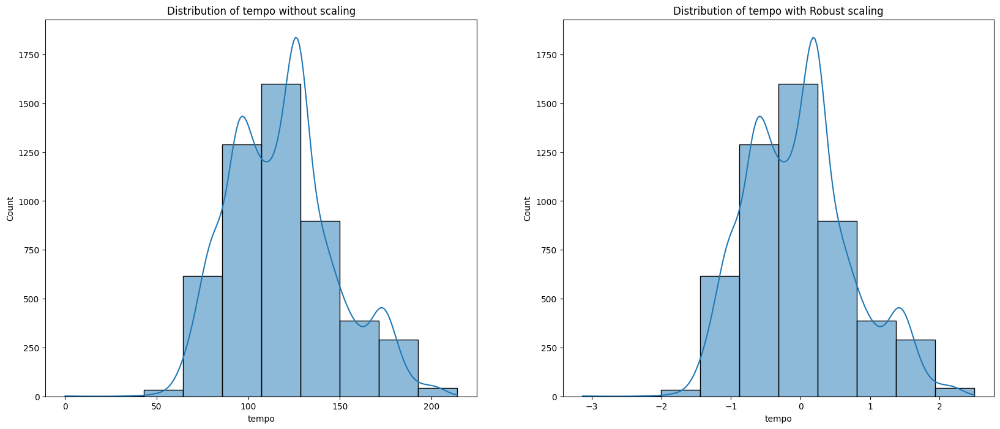

In [ ]:
# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the two plots
sns.histplot(data=spotify_songs_df_copy.iloc[:,-1], bins=10, kde=True, ax=ax1);
sns.histplot(spotify_songs_robust.iloc[:,-1], bins=10, kde=True, ax=ax2);

# Adding titles to the plots
ax1.set_title('Distribution of tempo without scaling')
ax2.set_title('Distribution of tempo with Robust scaling')

plt.show()

Let's have a look at the affect Robust scaling had on the heatmap

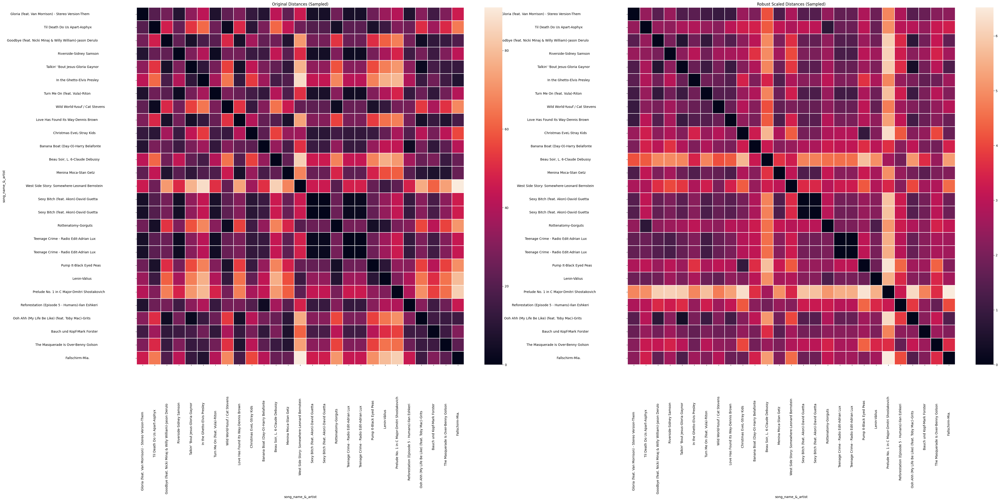

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_robust_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_robust),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)

# Making the DataFrame for the original heatmap
spotify_songs_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_df_copy),
                                     index=spotify_songs_df_copy.index,
                                     columns=spotify_songs_df_copy.index)


sample_indices = spotify_songs_df_copy.index.to_series().sample(25, random_state=42)
spotify_songs_robust_distances_sample_df = spotify_songs_robust_distances_df.loc[sample_indices, sample_indices]
spotify_songs_distances_sample_df = spotify_songs_distances_df.loc[sample_indices, sample_indices]

# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(50, 20))

# Plotting the two plots
sns.heatmap(spotify_songs_distances_sample_df, ax=ax1, linewidths=.2);
sns.heatmap(spotify_songs_robust_distances_sample_df, ax=ax2, linewidths=.2);

# Adding titles to the plots
ax1.set_title('Original Distances (Sampled)')
ax2.set_title('Robust Scaled Distances (Sampled)')

plt.show()

The robust scaler can often be a good idea, it's designed to help against outliers affecting the data by using the interquartile range instead of the full range (like the minmax scaler). Unfortunately, here it hasn't helped much because the interquartile range of the age column is so much larger than the interquartile range of any other column, and therefore the age column still distorts our concept of similarity (distance).

---
### 1.4 Transformers - changing the range and the distribution 🎛️
Transformers change the distribution to more closely resemble a normal distribution. Data that conforms to the normal distribution in machine learning is advantageous for model construction since it simplifies the maths. The assumption that the distribution is normal is explicitly used in the calculations for models like LDA, Gaussian Naive Bayes, Logistic Regression, Linear Regression, etc.

#### 4.1 Quantile transformer

All of the columns get scaled according to their [quantile](https://en.wikipedia.org/wiki/Quantile).

> **Note:** Quantiles are divisions of data that tell us how much of the data is present below a certain point. For example, the median is the middle value in a dataset, so it is a quantile of 0.5, meaning that half of the data exists at or below the median. Similarly, 78% of the data exists at or below the quantile 0.78.

Let's apply this to the whole DataFrame:

In [ ]:
# Number of samples
number_of_samples = spotify_songs_df_copy.shape[0]

# Create a QuantileTransformer object
scaler_transformer = QuantileTransformer(n_quantiles = number_of_samples).set_output(transform="pandas")

# Transform the foods_df DataFrame
spotify_songs_quantile = scaler_transformer.fit_transform(spotify_songs_df_copy)

To exemplify the effects of Quantile transformation, let's compare the original values of the age column to the transformed values.

In [ ]:
# Display age column of original DataFrame and age column of Quantile DataFrame to compare
pd.DataFrame({
    'original': spotify_songs_df_copy.iloc[:,-1],
    'quantile_transformed': spotify_songs_quantile.iloc[:,-1]
}).sort_values(by='original')

,original,quantile_transformed
song_name_&_artist,,
Shake It Off-Taylor Swift,0.000,0.000000
"French Suite No. 5 in G Major, BWV 816: I. Allemande-Johann Sebastian Bach",34.856,0.000194
Immortal Coil-Morpheus Descends,42.817,0.000388
Sunset Monet-Hauschka,49.654,0.000582
I Got It Bad And That Ain't Good-Oscar Peterson Trio,49.689,0.000776
...,...,...
Ready Teddy-Little Richard,205.973,0.999224
(Sittin' On) the Dock of the Bay-Otis Redding,205.981,0.999418
Rebel Rouser-Duane Eddy,206.313,0.999612


If we plot the original and Quantile transformed ages below, we can see that Quantile transforming not only affects the range of the data on the x-axis, but the shape of the distribution too.

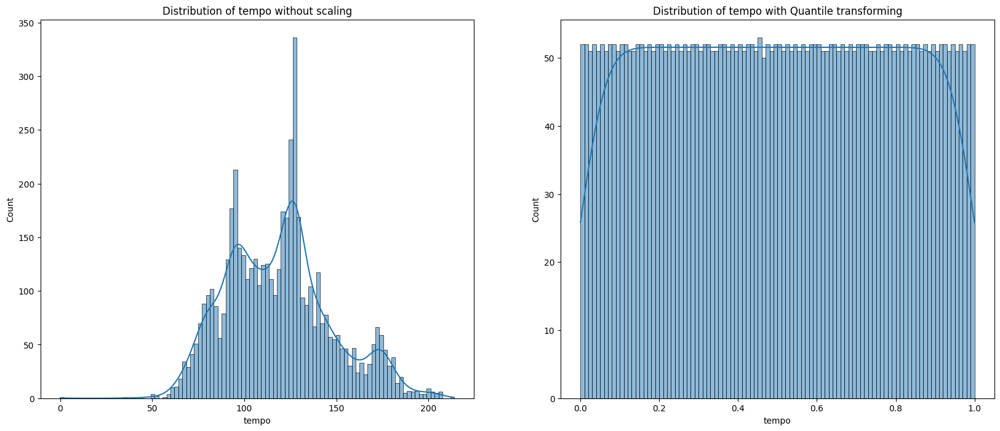

In [ ]:
# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the two plots
sns.histplot(data=spotify_songs_df_copy.iloc[:,-1], bins=100, kde=True, ax=ax1);
sns.histplot(spotify_songs_quantile.iloc[:,-1], bins=100, kde=True, ax=ax2);

# Adding titles to the plots
ax1.set_title('Distribution of tempo without scaling')
ax2.set_title('Distribution of tempo with Quantile transforming')

plt.show()

Let's have a look at the affect Quantile transformation had on the heatmap

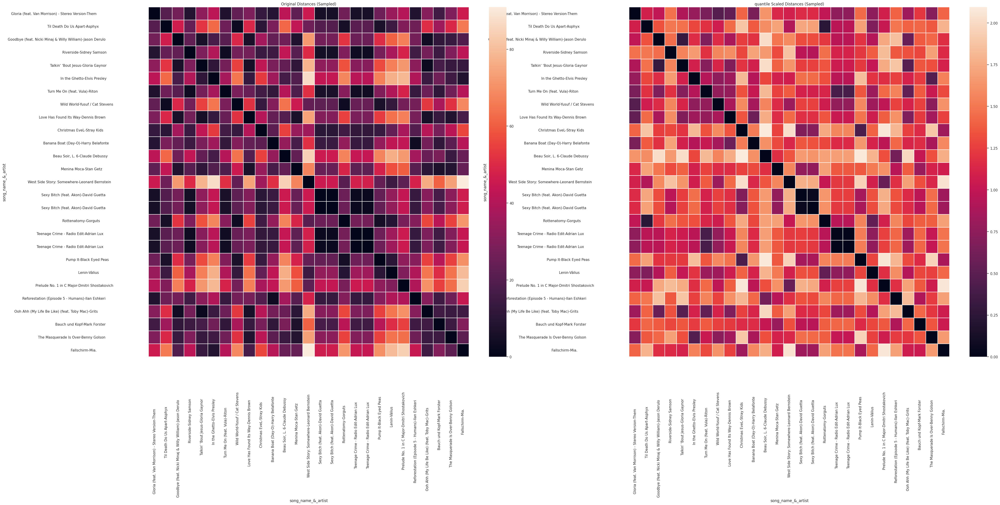

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_quantile_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_quantile),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)

# Making the DataFrame for the original heatmap
spotify_songs_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_df_copy),
                                     index=spotify_songs_df_copy.index,
                                     columns=spotify_songs_df_copy.index)


sample_indices = spotify_songs_df_copy.index.to_series().sample(25, random_state=42)
spotify_songs_quantile_distances_sample_df = spotify_songs_quantile_distances_df.loc[sample_indices, sample_indices]
spotify_songs_distances_sample_df = spotify_songs_distances_df.loc[sample_indices, sample_indices]

# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(50, 20))

# Plotting the two plots
sns.heatmap(spotify_songs_distances_sample_df, ax=ax1, linewidths=.2);
sns.heatmap(spotify_songs_quantile_distances_sample_df, ax=ax2, linewidths=.2);

# Adding titles to the plots
ax1.set_title('Original Distances (Sampled)')
ax2.set_title('quantile Scaled Distances (Sampled)')

plt.show()

#### Quantile Transformation only on Tempo and loudness column


In [ ]:
# Number of samples
number_of_samples = spotify_songs_df_copy.shape[0]

# Create a QuantileTransformer object
scaler_transformer = QuantileTransformer(n_quantiles=number_of_samples).set_output(transform="pandas")

# Transform the "loudness" and "tempo" columns
spotify_songs_quantile = scaler_transformer.fit_transform(spotify_songs_df_copy[["loudness", "tempo"]])

# Drop the original "loudness" and "tempo" columns
spotify_songs_df_drop = spotify_songs_df_copy.drop(["loudness", "tempo"], axis=1)

# Combine the remaining columns with the transformed quantile data
spotify_songs_quantile_2 = pd.concat([spotify_songs_df_drop, spotify_songs_quantile], axis=1)


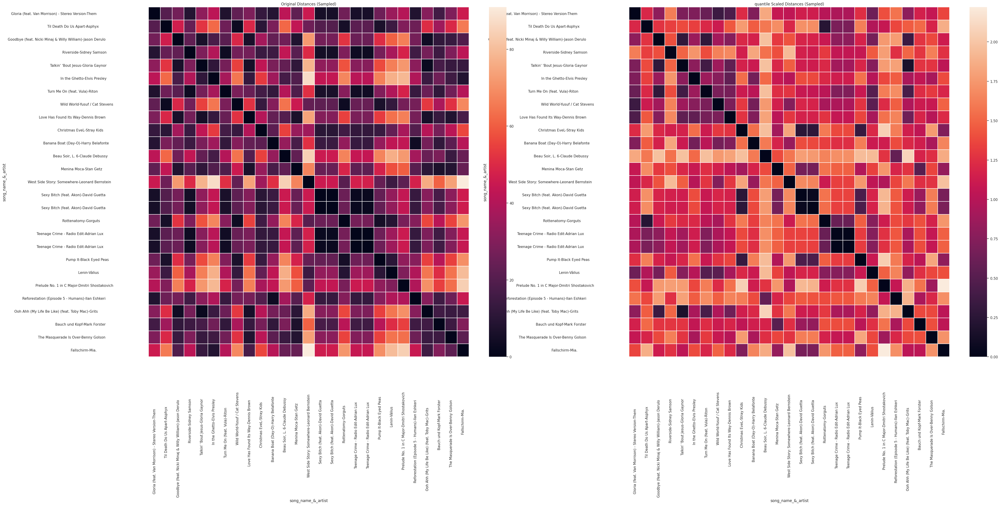

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_quantile_2_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_quantile_2),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)

# Making the DataFrame for the original heatmap
spotify_songs_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_df_copy),
                                     index=spotify_songs_df_copy.index,
                                     columns=spotify_songs_df_copy.index)


sample_indices = spotify_songs_df_copy.index.to_series().sample(25, random_state=42)
spotify_songs_quantile_2_distances_sample_df = spotify_songs_quantile_2_distances_df.loc[sample_indices, sample_indices]
spotify_songs_distances_sample_df = spotify_songs_distances_df.loc[sample_indices, sample_indices]

# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(50, 20))

# Plotting the two plots
sns.heatmap(spotify_songs_distances_sample_df, ax=ax1, linewidths=.2);
sns.heatmap(spotify_songs_quantile_2_distances_sample_df, ax=ax2, linewidths=.2);

# Adding titles to the plots
ax1.set_title('Original Distances (Sampled)')
ax2.set_title('quantile Scaled Distances (Sampled)')

plt.show()

#### 4.2 Power transformer

Power transformers transform the data via [power functions](https://en.wikipedia.org/wiki/Power_transform). They can use either the Yeo-Johnson transformation, or the Box-Cox transformation. You don't need to understand the maths behind this one, just know that it reshapes the data to more closely resemble the normal distribution.

Let's apply this to the whole DataFrame:

In [ ]:
spotify_songs_df_copy.head(1)

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,0.658,0.259,-13.141,0,0.0705,0.000059,0.306,110.376


In [ ]:
# Create a PowerTransformer object
scaler_power = PowerTransformer().set_output(transform="pandas")
"""
In this notebook we use the inline version of .set_output(transform="pandas")
Instead of the universal:
  from sklearn import set_config
  set_config(transform_output = "pandas")

This is because of a known bug when using the universal version with power transformer
https://github.com/scikit-learn/scikit-learn/issues/26443
"""

# Transform the foods_df DataFrame
spotify_songs_power = scaler_power.fit_transform(spotify_songs_df_copy[["tempo"]])

To exemplify the effects of Power transformation, let's compare the original values of the age column to the transformed values.

In [ ]:
# Display 1st column of original DataFrame and 1st column of Power transformed DataFrame to compare
pd.DataFrame({
    'original': spotify_songs_df_copy.iloc[:,-1],
    'power_transformed': spotify_songs_power.iloc[:,-1]
}).sort_values(by='original')

,original,power_transformed
song_name_&_artist,,
Shake It Off-Taylor Swift,0.000,-7.723036
"French Suite No. 5 in G Major, BWV 816: I. Allemande-Johann Sebastian Bach",34.856,-3.756405
Immortal Coil-Morpheus Descends,42.817,-3.265131
Sunset Monet-Hauschka,49.654,-2.878947
I Got It Bad And That Ain't Good-Oscar Peterson Trio,49.689,-2.877042
...,...,...
Ready Teddy-Little Richard,205.973,2.685903
(Sittin' On) the Dock of the Bay-Otis Redding,205.981,2.686114
Rebel Rouser-Duane Eddy,206.313,2.694857


If we plot the original and Power transformed ages below, we can see that Power transforming not only affects the range of the data on the x-axis, but the shape of the distribution too.

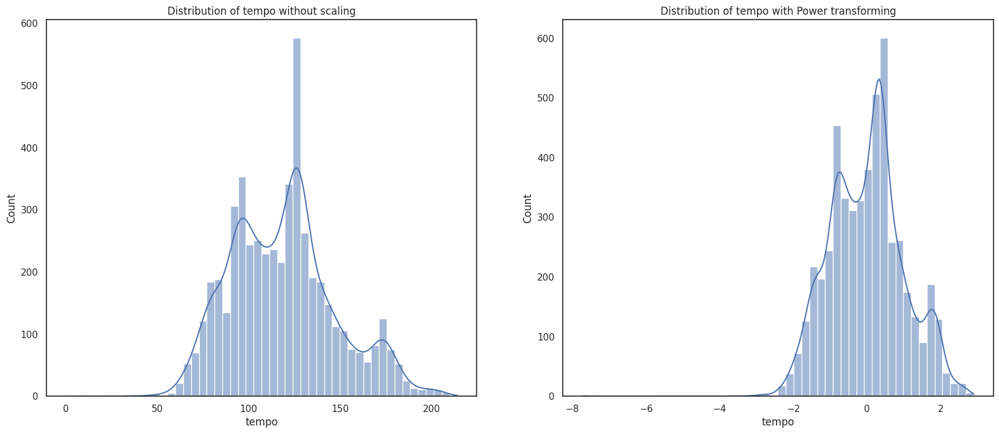

In [ ]:
# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plotting the two plots
sns.histplot(data=spotify_songs_df_copy.iloc[:,-1], bins=50, kde=True, ax=ax1);
sns.histplot(data=spotify_songs_power.iloc[:,-1], bins=50, kde=True, ax=ax2);

# Adding titles to the plots
ax1.set_title('Distribution of tempo without scaling')
ax2.set_title('Distribution of tempo with Power transforming')

plt.show()

Let's have a look at the affect Power transformation had on the heatmap

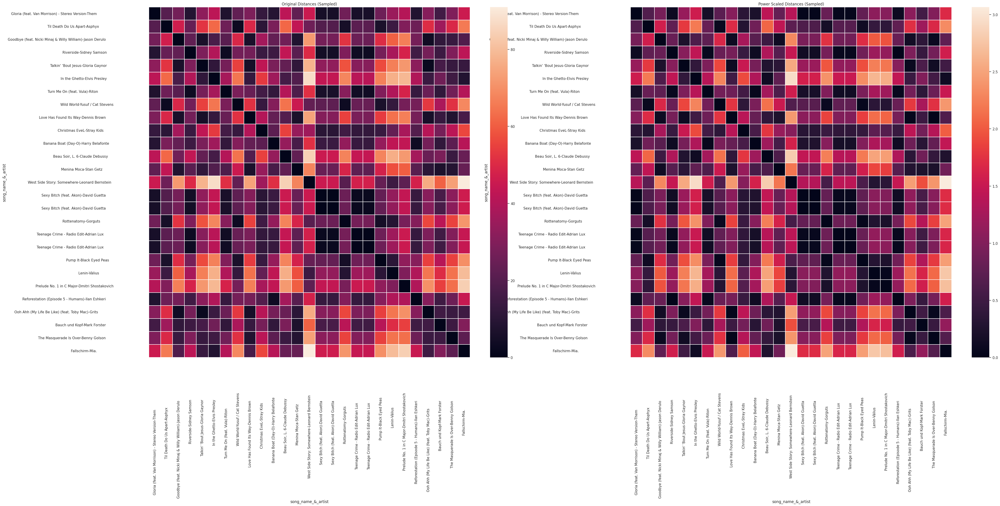

In [ ]:
# Making the DataFrame for the MinMaxed heatmap
spotify_songs_power_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_power),
                                         index=spotify_songs_df_copy.index,
                                         columns=spotify_songs_df_copy.index)

# Making the DataFrame for the original heatmap
spotify_songs_distances_df = pd.DataFrame(pairwise_distances(spotify_songs_df_copy),
                                     index=spotify_songs_df_copy.index,
                                     columns=spotify_songs_df_copy.index)


sample_indices = spotify_songs_df_copy.index.to_series().sample(25, random_state=42)
spotify_songs_power_distances_sample_df = spotify_songs_power_distances_df.loc[sample_indices, sample_indices]
spotify_songs_distances_sample_df = spotify_songs_distances_df.loc[sample_indices, sample_indices]

# Stating that we want two plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(50, 20))

# Plotting the two plots
sns.heatmap(spotify_songs_distances_sample_df, ax=ax1, linewidths=.2);
sns.heatmap(spotify_songs_power_distances_sample_df, ax=ax2, linewidths=.2);

# Adding titles to the plots
ax1.set_title('Original Distances (Sampled)')
ax2.set_title('Power Scaled Distances (Sampled)')

plt.show()

---
## 1.5.&nbsp; Comparing all 6 options 🔍

### 5.1.&nbsp; All 6 histograms for comparison

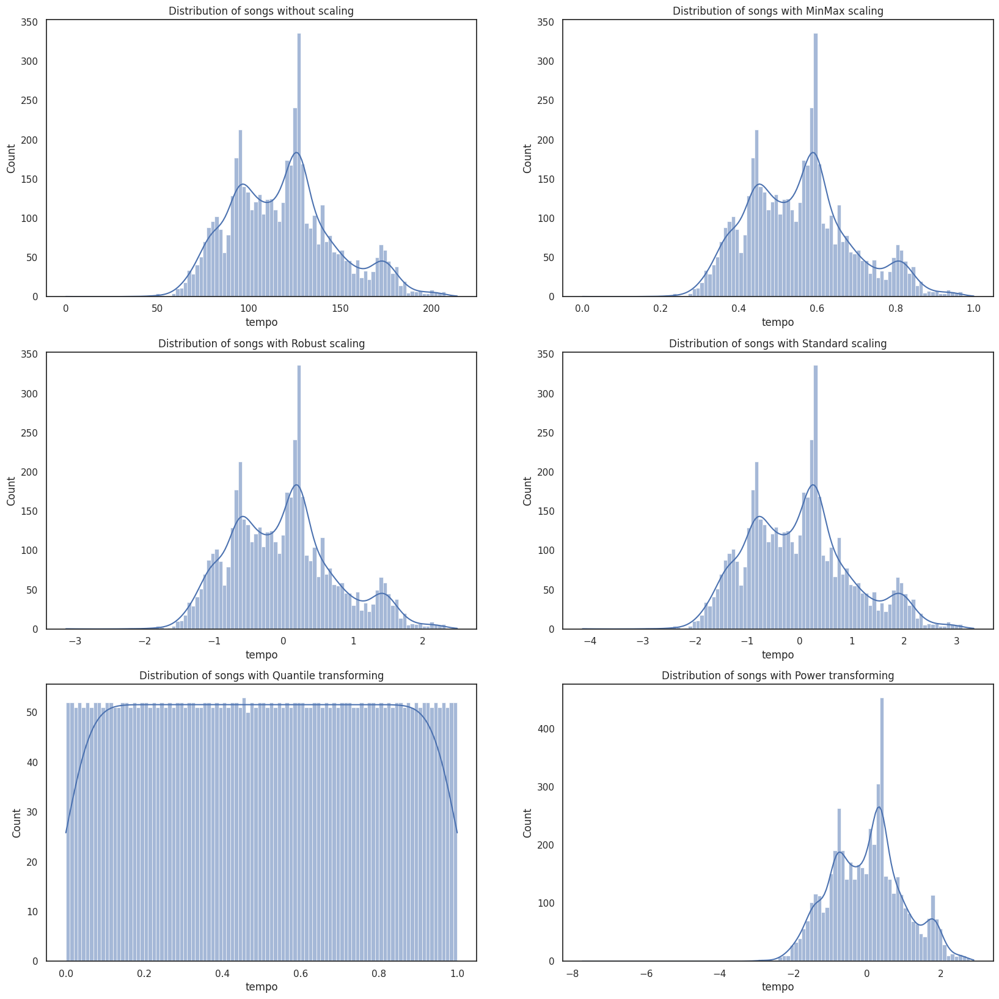

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(20, 20))

sns.histplot(data=spotify_songs_df_copy.iloc[:,-1], bins=100, kde=True, ax=ax[0, 0]);
sns.histplot(data=spotify_songs_minmax.iloc[:,-1], bins=100, kde=True, ax=ax[0, 1]);
sns.histplot(data=spotify_songs_robust.iloc[:,-1], bins=100, kde=True, ax=ax[1, 0]);
sns.histplot(data=spotify_songs_standard.iloc[:,-1], bins=100, kde=True, ax=ax[1, 1]);
sns.histplot(data=spotify_songs_quantile.iloc[:,-1], bins=100, kde=True, ax=ax[2, 0]);
sns.histplot(data=spotify_songs_power.iloc[:,-1], bins=100, kde=True, ax=ax[2, 1]);

ax[0, 0].set_title('Distribution of songs without scaling')
ax[0, 1].set_title('Distribution of songs with MinMax scaling')
ax[1, 0].set_title('Distribution of songs with Robust scaling')
ax[1, 1].set_title('Distribution of songs with Standard scaling')
ax[2, 0].set_title('Distribution of songs with Quantile transforming')
ax[2, 1].set_title('Distribution of songs with Power transforming')

plt.show()

### 5.2.&nbsp; All 6 heatmaps for comparison

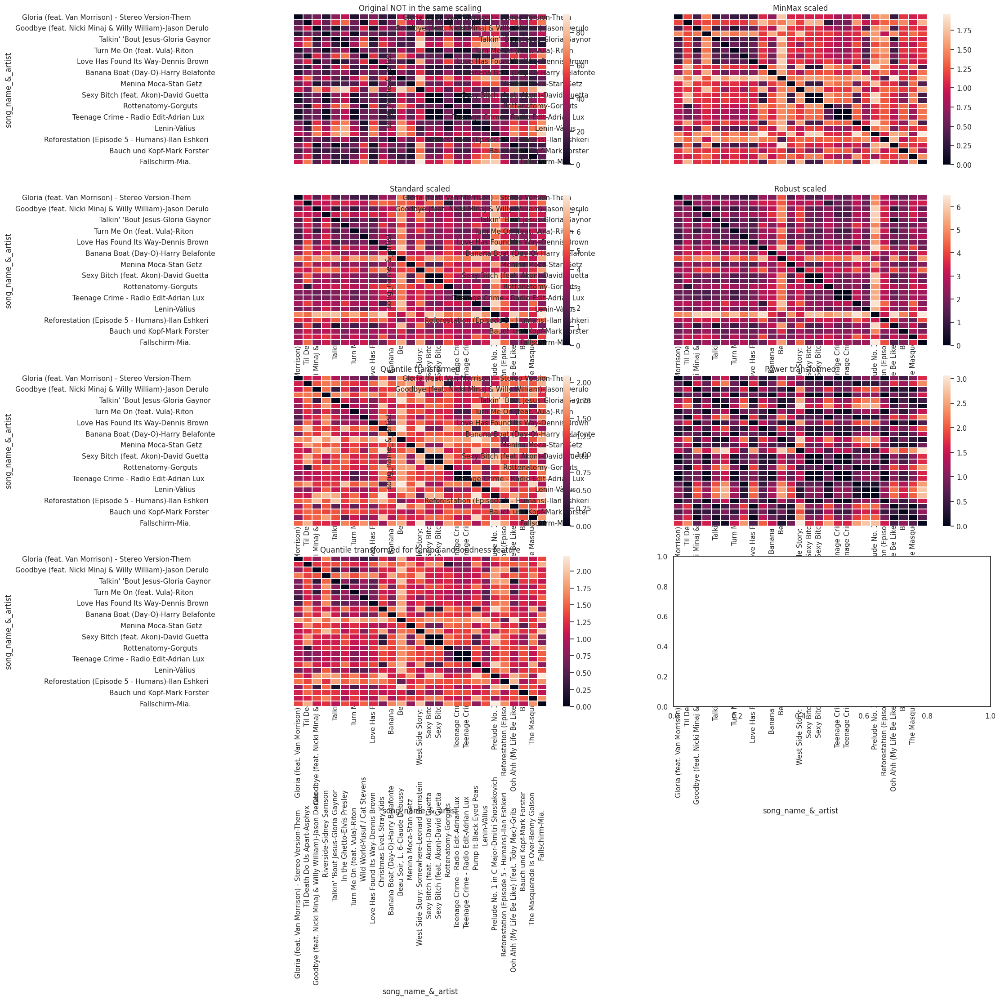

In [ ]:
fig, ax = plt.subplots(4, 2, figsize=(20, 20))

sns.heatmap(spotify_songs_distances_sample_df, ax=ax[0, 0], linewidths=.2);
sns.heatmap(spotify_songs_minmax_distances_sample_df, ax=ax[0, 1], linewidths=.2);
sns.heatmap(spotify_songs_standard_distances_sample_df, ax=ax[1, 0], linewidths=.2);
sns.heatmap(spotify_songs_robust_distances_sample_df, ax=ax[1, 1], linewidths=.2);
sns.heatmap(spotify_songs_quantile_distances_sample_df, ax=ax[2, 0], linewidths=.2);
sns.heatmap(spotify_songs_power_distances_sample_df, ax=ax[2, 1], linewidths=.2);
sns.heatmap(spotify_songs_quantile_2_distances_sample_df, ax=ax[3, 0], linewidths=.2);

ax[0, 0].set_title('Original NOT in the same scaling')
ax[0, 1].set_title('MinMax scaled')
ax[1, 0].set_title('Standard scaled')
ax[1, 1].set_title('Robust scaled')
ax[2, 0].set_title('Quantile transformed')
ax[2, 1].set_title('Power transformed')
ax[3, 0].set_title('Quantile transformed for tempo and loudness feature')

plt.show()

If you wish to explore further, [SKLearn: Compare the effect of different scalers on data with outliers](https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html#sphx-glr-auto-examples-preprocessing-plot-all-scaling-py)

In [ ]:
# Create the figure and axes
fig, ax = plt.subplots(4, 2, figsize=(100, 100))  # Increased figure size

# Plot each heatmap
heatmaps = [
    (spotify_songs_distances_sample_df, "Original NOT in the same scaling"),
    (spotify_songs_minmax_distances_sample_df, "MinMax scaled"),
    (spotify_songs_standard_distances_sample_df, "Standard scaled"),
    (spotify_songs_robust_distances_sample_df, "Robust scaled"),
    (spotify_songs_quantile_distances_sample_df, "Quantile transformed"),
    (spotify_songs_power_distances_sample_df, "Power transformed"),
    (spotify_songs_quantile_2_distances_sample_df, "Quantile transformed for tempo and loudness feature")
]

for i, (data, title) in enumerate(heatmaps):
    row, col = divmod(i, 2)  # Calculate row and column indices
    sns.heatmap(data, ax=ax[row, col], linewidths=0.2, cmap="coolwarm", cbar=True)  # Enable color bar for clarity
    ax[row, col].set_title(title, fontsize=28)
    ax[row, col].tick_params(axis="both", which="major", labelsize=16)

# Turn off the last empty subplot
ax[3, 1].axis("off")

# Add an overall title
fig.suptitle("Heatmaps of Different Scaling Methods", fontsize=48, weight='bold', y=1.03)

# Tight layout to manage spacing
plt.tight_layout()

# Display the plots
plt.show()

## 1.6. Principal Component Analysis (PCA)

PCA is an unsupervised technique that processes unlabelled data to restructure the columns of a dataframe. The primary use of PCA is dimensionality reduction, which reduces the number of columns without losing significant information. This streamlining of data has a notable secondary effect: it reduces noise. Noise in data refers to random variations or errors that obscure underlying patterns or signals, making it harder to extract meaningful information.

In this project, we don't have many columns, so dimensionality reduction isn't a major concern. However, this technique will be particularly useful in our next project, supervised machine learning. For now, you'll find that the noise reduction achieved through PCA helps to create better clusters, demonstrating why PCA is such a valuable unsupervised learning tool.

---
### 3.&nbsp; PCA ⚙️
As you saw on the LMS, PCA creates as many principal components as the original DataFrame has columns. We then need to decide how many of these components to keep. Before we do that, let's look at how PCA transforms our DataFrame.

Challenge: apply this to the spotify dataset 😃
Use PCA to reduce noise and the dimensionality of the Spotify dataset before clustering the songs. This will help to identify the most important features of the songs, and it will also make the clustering process more efficient.

Once you have clustered the songs using the selected principal components, you can analyse the clusters to identify groups of similar songs. For example, you could look for clusters of songs with similar genres, tempos, or moods.

### PCA and MinMAx Scaler

In [ ]:
# Initialise the PCA object
pca = PCA()

# Fit the PCA object to the data
pca.fit(spotify_songs_minmax)

# Transform scaled_features_df based on the fit calculations
pca_basic_df = pca.transform(spotify_songs_minmax)

pca_basic_df

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,-0.656770,-0.015899,-0.437267,-0.244612,0.075202,0.071865,0.003045,0.006573
Saudade De Bahia-Antônio Carlos Jobim,0.298091,-0.400101,-0.356198,0.091389,-0.008363,0.060010,-0.026592,-0.024405
"Canta Canta, Minha Gente-Martinho Da Vila",0.262194,-0.610673,-0.073384,0.289746,0.134999,-0.072600,0.292571,-0.063965
Mulher Eu Sei-Chico César,0.324205,-0.222725,-0.685134,-0.063513,0.033487,0.042414,0.011642,-0.014424
Rosa Morena-Kurt Elling,0.334831,-0.155836,-0.598071,-0.164377,0.009509,0.099051,-0.003844,-0.059750
...,...,...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",0.464029,0.744619,-0.454929,-0.115434,-0.008932,-0.087220,0.016051,-0.007899
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",0.439735,0.534201,-0.456499,-0.321823,-0.022275,-0.127762,0.008852,-0.009214
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.511832,1.065956,-0.534795,-0.028099,-0.060581,-0.210719,0.050951,-0.258487


> You may notice that we have the same amount of columns as before but we have lost the column names. This is because the columns are now principal components and not the original features (danceability, speechiness, etc...). Principal components are an abstraction of the original features, capturing the most significant patterns and trends within the data. They are like new axes along which the data is spread out, representing directions of maximum variance. The first principal component explains the largest amount of variance, followed by the second, and so on.

#####3.1.&nbsp; Identifying the most informative principal components
Principal component analysis (PCA) assumes that variance is information. This means that PCA believes that the directions in which the data varies the most are the most important.

When we fit PCA to our data, it calculates all of the principal components. We can see how much variance each principal component explains using the `explained_variance_ratio_` attribute.
> The principal components are ranked in order of decreasing variance, with the first principal component explaining the most variance in the data

In [ ]:
# Get the variance explained by each principal component
explained_variance_array = pca.explained_variance_ratio_

explained_variance_array

array([0.36963464, 0.33546726, 0.13972109, 0.08697251, 0.03096303,
       0.02502077, 0.00856717, 0.00365352])

To determine how many principal components to keep, we can use one of two methods:

- **Elbow method**: This is a more manual approach where we plot the explained variance of each principal component against its index. The elbow point is the point at which the explained variance starts to drop off significantly. This is the point at which it is no longer worth retaining any more principal components, as they are not explaining much additional variance.
- **Cumulative explained variance**: This is a more automated approach where SKLearn calculates how many principal components contain a given amount of variance, such as 95%.

#####3.1.1.&nbsp; Elbow method
The elbow method works by plotting the variance of each principal component against its index.

In [ ]:
pd.DataFrame(explained_variance_array, columns=["Variance explained"])

,Variance explained
0,0.369635
1,0.335467
2,0.139721
3,0.086973
4,0.030963
5,0.025021
6,0.008567
7,0.003654


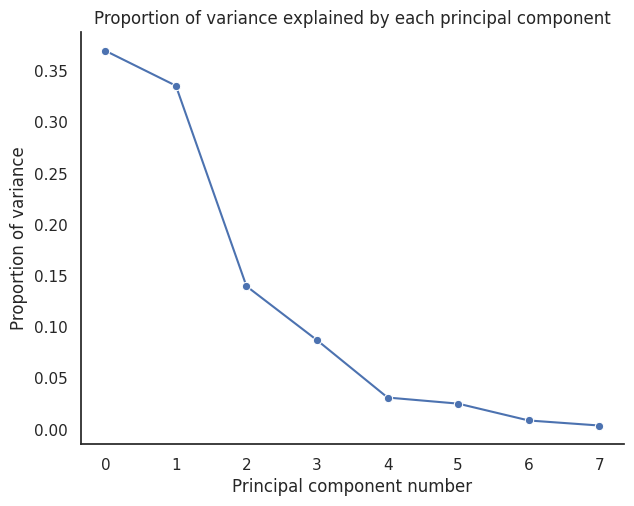

In [ ]:
# Create a Pandas DataFrame from the variance explained array
explained_variance_array_df = pd.DataFrame(explained_variance_array, columns=["Variance explained"])

(
  # Create a line chart with sns.relplot
  sns.relplot(
      kind = 'line',
      data = explained_variance_array_df,
      x = explained_variance_array_df.index,
      y = "Variance explained",
      marker = 'o',
      aspect = 1.3)
  # Set the title of the plot
  .set(title = "Proportion of variance explained by each principal component")
  # Set the axis labels
  .set_axis_labels("Principal component number", "Proportion of variance")
);

Just like the elbow method used to determine the optimal number of clusters for k-means clustering, we are looking for a point where the decrease in variance levels off. This point, known as the elbow point, marks the point at which the explained variance starts to reduce significantly.

In [ ]:
# Set the variable elbow to where you believe the elbow is
elbow = 4

Let's make a DataFrame containing these principle components

In [ ]:
# Create a PCA object with {elbow} principal components
# We add 1 as the principal components start at 0 and not 1
pca_elbow = PCA(n_components = elbow + 1)

# Fit the PCA object to the scaled features dataframe and transform it
pca_elbow_df = pca_elbow.fit_transform(spotify_songs_minmax)

# The dataframe now contains the principal components of the scaled features dataframe
pca_elbow_df

,pca0,pca1,pca2,pca3,pca4
song_name_&_artist,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,-0.656770,-0.015899,-0.437267,-0.244612,0.075202
Saudade De Bahia-Antônio Carlos Jobim,0.298091,-0.400101,-0.356198,0.091389,-0.008363
"Canta Canta, Minha Gente-Martinho Da Vila",0.262194,-0.610673,-0.073384,0.289746,0.134999
Mulher Eu Sei-Chico César,0.324205,-0.222725,-0.685134,-0.063513,0.033487
Rosa Morena-Kurt Elling,0.334831,-0.155836,-0.598071,-0.164377,0.009509
...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",0.464029,0.744619,-0.454929,-0.115434,-0.008932
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",0.439735,0.534201,-0.456499,-0.321823,-0.022275
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.511832,1.065956,-0.534795,-0.028099,-0.060581


#####3.1.2.&nbsp; Cumulative explained variance
Cumulative explained variance (CEV) is calculated by summing the explained variance of each principal component. The CEV plot shows how much variance is explained by each principal component, as well as the cumulative variance explained by all principal components up to that point.

In [ ]:
cumulative_sum_of_variance = np.cumsum(explained_variance_array)

cumulative_sum_of_variance

array([0.36963464, 0.70510191, 0.844823  , 0.93179551, 0.96275854,
       0.9877793 , 0.99634648, 1.        ])

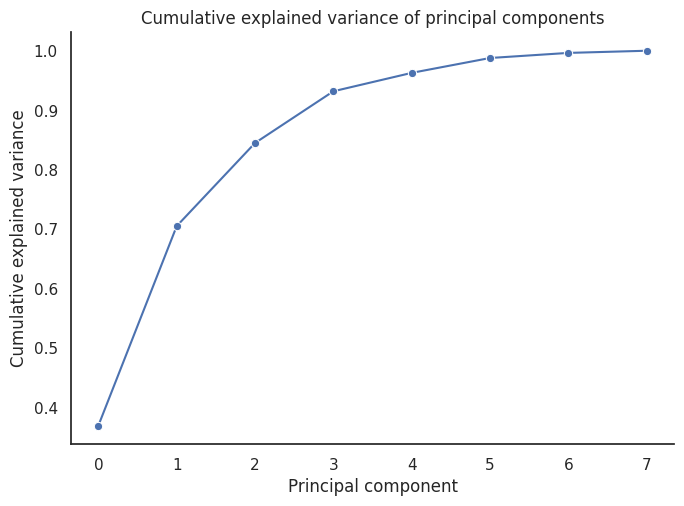

In [ ]:
(
  # Create a cumulative explained variance plot
  sns.relplot(
      kind = "line",  # Create a line plot
      x = range(len(explained_variance_array)),  # Set the x-axis to be the principal component index
      y = cumulative_sum_of_variance,  # Set the y-axis to be the cumulative explained variance
      marker = "o",  # Use a circle marker for the data points
      aspect = 1.4,  # Set the aspect ratio of the plot to be 1.4
  )
  # Set the title of the plot
  .set(title = "Cumulative explained variance of principal components")
  # Set the axis labels
  .set_axis_labels("Principal component", "Cumulative explained variance")
);

We can also look for an elbow in the cumulative variance plot to determine how many principal components to retain. However, instead of doing that, we will set a cumulative variance threshold in the PCA constructor. This threshold tells scikit-learn how many principal components to retain. For example, 0.95 tells scikit-learn that we want to retain as many principle components as contain 95% or more of the variance.

In [ ]:
# Create a PCA object
pca_variance = PCA(n_components = 0.95)

Let's visualise this threshold

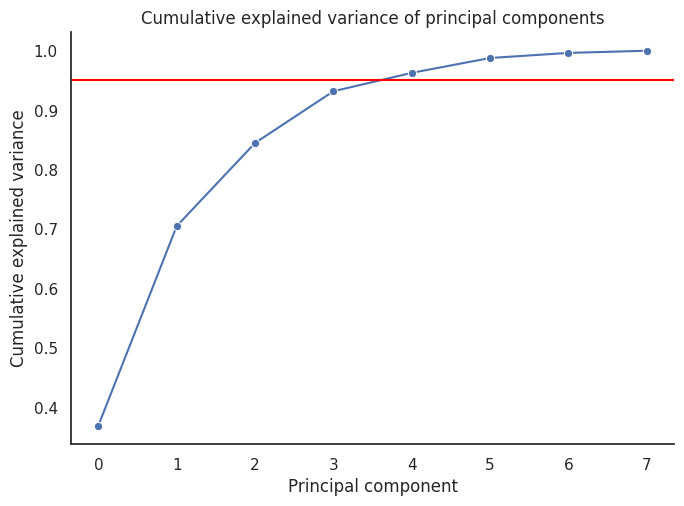

In [ ]:
(
  # Create a cumulative explained variance plot
  sns.relplot(
      kind = "line",  # Create a line plot
      x = range(len(explained_variance_array)),  # Set the x-axis to be the principal component index
      y = cumulative_sum_of_variance,  # Set the y-axis to be the cumulative explained variance
      marker = "o",  # Use a circle marker for the data points
      aspect = 1.4,  # Set the aspect ratio of the plot to be 1.4
  )
  # Set the title of the plot
  .set(title="Cumulative explained variance of principal components")
  # Set the axis labels
  .set_axis_labels("Principal component", "Cumulative explained variance")
);

# Add a horizontal red line at 0.95 on the y axis
plt.axhline(y = 0.95,
            color = 'red');

Let's apply this to our scaled data

In [ ]:
# Fit the PCA object to the scaled features dataframe and transform it
pca_variance_df = pca_variance.fit_transform(spotify_songs_minmax)

# The dataframe now contains the principal components of the scaled features dataframe
pca_variance_df

,pca0,pca1,pca2,pca3,pca4
song_name_&_artist,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,-0.656770,-0.015899,-0.437267,-0.244612,0.075202
Saudade De Bahia-Antônio Carlos Jobim,0.298091,-0.400101,-0.356198,0.091389,-0.008363
"Canta Canta, Minha Gente-Martinho Da Vila",0.262194,-0.610673,-0.073384,0.289746,0.134999
Mulher Eu Sei-Chico César,0.324205,-0.222725,-0.685134,-0.063513,0.033487
Rosa Morena-Kurt Elling,0.334831,-0.155836,-0.598071,-0.164377,0.009509
...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",0.464029,0.744619,-0.454929,-0.115434,-0.008932
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",0.439735,0.534201,-0.456499,-0.321823,-0.022275
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",0.511832,1.065956,-0.534795,-0.028099,-0.060581


### PCA and Quantile Transformed (loudeness and tempo)

In [ ]:
# Initialise the PCA object
pca = PCA()

# Fit the PCA object to the data
pca.fit(spotify_songs_quantile_2)

# Transform scaled_features_df based on the fit calculations
pca_basic_df = pca.transform(spotify_songs_quantile_2)

pca_basic_df

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7
song_name_&_artist,,,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,-0.326205,-0.551359,-0.535669,0.106676,-0.253611,0.031767,0.120381,0.001056
Saudade De Bahia-Antônio Carlos Jobim,0.126220,0.378539,-0.471158,0.274494,0.067487,-0.039534,0.095156,-0.028109
"Canta Canta, Minha Gente-Martinho Da Vila",-0.032233,0.503789,-0.450863,-0.165910,0.321349,-0.214654,0.222031,0.251330
Mulher Eu Sei-Chico César,0.330736,0.209653,-0.763534,0.165524,-0.086773,0.088816,0.040034,0.008343
Rosa Morena-Kurt Elling,0.355631,0.189190,-0.626039,0.279943,-0.195346,0.060886,0.086865,-0.009335
...,...,...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",0.978262,-0.356441,-0.337404,-0.133472,-0.115042,0.077542,-0.105273,0.013279
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",0.842139,-0.230517,-0.422824,-0.172262,-0.309900,0.003677,-0.100940,0.005182
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",1.190879,-0.539376,-0.299171,-0.219998,-0.025148,0.074353,-0.201360,0.022299


In [ ]:
# Get the variance explained by each principal component
explained_variance_array = pca.explained_variance_ratio_

explained_variance_array

array([0.31648513, 0.29923807, 0.15790835, 0.10083779, 0.06961156,
       0.03266935, 0.01729814, 0.00595162])

#####3.1.2.&nbsp; Cumulative explained variance
Cumulative explained variance (CEV) is calculated by summing the explained variance of each principal component. The CEV plot shows how much variance is explained by each principal component, as well as the cumulative variance explained by all principal components up to that point.

In [ ]:
cumulative_sum_of_variance = np.cumsum(explained_variance_array)

cumulative_sum_of_variance

array([0.31648513, 0.61572319, 0.77363154, 0.87446933, 0.94408089,
       0.97675024, 0.99404838, 1.        ])

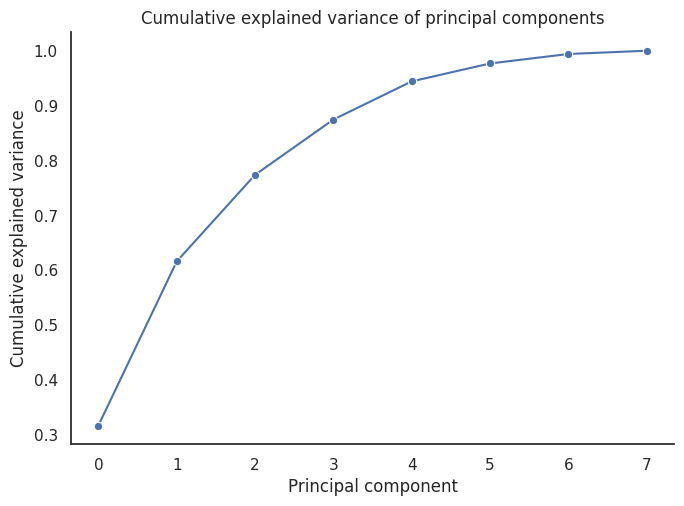

In [ ]:
(
  # Create a cumulative explained variance plot
  sns.relplot(
      kind = "line",  # Create a line plot
      x = range(len(explained_variance_array)),  # Set the x-axis to be the principal component index
      y = cumulative_sum_of_variance,  # Set the y-axis to be the cumulative explained variance
      marker = "o",  # Use a circle marker for the data points
      aspect = 1.4,  # Set the aspect ratio of the plot to be 1.4
  )
  # Set the title of the plot
  .set(title = "Cumulative explained variance of principal components")
  # Set the axis labels
  .set_axis_labels("Principal component", "Cumulative explained variance")
);

We can also look for an elbow in the cumulative variance plot to determine how many principal components to retain. However, instead of doing that, we will set a cumulative variance threshold in the PCA constructor. This threshold tells scikit-learn how many principal components to retain. For example, 0.95 tells scikit-learn that we want to retain as many principle components as contain 95% or more of the variance.

In [ ]:
# Create a PCA object
pca_variance = PCA(n_components = 0.95)

Let's visualise this threshold

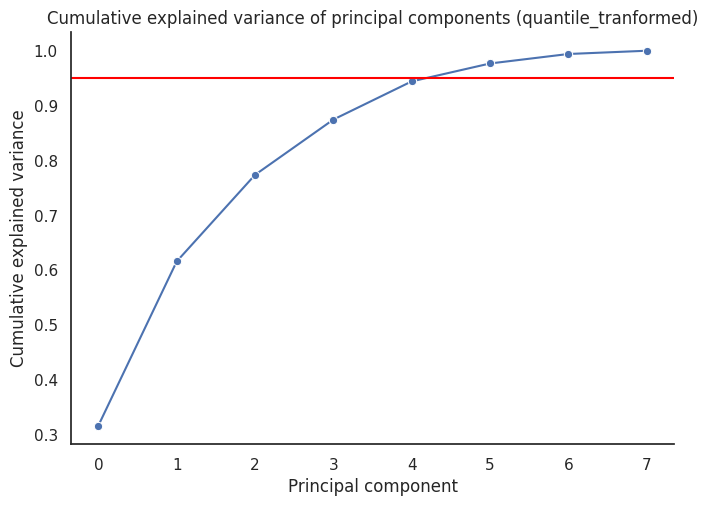

In [ ]:
(
  # Create a cumulative explained variance plot
  sns.relplot(
      kind = "line",  # Create a line plot
      x = range(len(explained_variance_array)),  # Set the x-axis to be the principal component index
      y = cumulative_sum_of_variance,  # Set the y-axis to be the cumulative explained variance
      marker = "o",  # Use a circle marker for the data points
      aspect = 1.4,  # Set the aspect ratio of the plot to be 1.4
  )
  # Set the title of the plot
  .set(title="Cumulative explained variance of principal components (quantile_tranformed)")
  # Set the axis labels
  .set_axis_labels("Principal component", "Cumulative explained variance")
);

# Add a horizontal red line at 0.95 on the y axis
plt.axhline(y = 0.95,
            color = 'red');

Let's apply this to our scaled data

In [ ]:
# Fit the PCA object to the scaled features dataframe and transform it
pca_variance_quantile_df = pca_variance.fit_transform(spotify_songs_quantile_2)

# The dataframe now contains the principal components of the scaled features dataframe
pca_variance_quantile_df

,pca0,pca1,pca2,pca3,pca4,pca5
song_name_&_artist,,,,,,
Se Eu Quiser Falar Com Deus-Gilberto Gil,-0.326205,-0.551359,-0.535669,0.106676,-0.253611,0.031767
Saudade De Bahia-Antônio Carlos Jobim,0.126220,0.378539,-0.471158,0.274494,0.067487,-0.039534
"Canta Canta, Minha Gente-Martinho Da Vila",-0.032233,0.503789,-0.450863,-0.165910,0.321349,-0.214654
Mulher Eu Sei-Chico César,0.330736,0.209653,-0.763534,0.165524,-0.086773,0.088816
Rosa Morena-Kurt Elling,0.355631,0.189190,-0.626039,0.279943,-0.195346,0.060886
...,...,...,...,...,...,...
"1812 Festival Overture, Op. 49: 1812 Overture, Op. 49-Pyotr Ilyich Tchaikovsky",0.978262,-0.356441,-0.337404,-0.133472,-0.115042,0.077542
"Winter Fragments pour ensemble instrumental, sons de synthèse et dispositif électronique-Tristan Murail",0.842139,-0.230517,-0.422824,-0.172262,-0.309900,0.003677
"Schoenberg: 5 Orchestral Pieces, Op. 16: No. 3 Farben (Colours)-Arnold Schoenberg",1.190879,-0.539376,-0.299171,-0.219998,-0.025148,0.074353


## 1.7 Analysing k-means: estimating the numbers of clusters
The number of clusters (k) is an important parameter for KMeans clustering. If k is too small, the clusters will be too large and will not accurately capture the underlying structure of the data. If k is too large, the clusters will be too small and will not be meaningful.

The inertia elbow method and the silhouette score are two popular methods for estimating the optimal number of clusters for KMeans. In this notebook, we will learn how to use both of these methods.

---
### 3 Estimate the number of clusters (k) 🔢

### 3.1 Inertia and the elbow method

In clustering, inertia is a measure of how well data points fit into their assigned clusters. Lower inertia indicates a better fit. However, minimising inertia alone can lead to meaningless clusters, with each data point in its own cluster.

The elbow method is a visual aid for identifying the optimal number of clusters. It plots inertia values for different cluster numbers, revealing an "elbow" where the inertia reduction begins to plateau. This plateau indicates that reducing inertia further has little impact on cluster quality.

To find the inertia score for our clusters, we can use the [KMeans attribute ](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)`.inertia_`.

We will cluster our song preferences data multiple times, starting with 1 cluster and increasing the number of clusters by 1 each time until we reach `max_k`. We will store the inertia score for each clustering in a list.

Once we've calculated the inertia scores for all values of k, we'll plot them on a line chart. We'll then look for the "elbow" in the line chart. The elbow is the point where the inertia score starts to plateau, indicating that adding more clusters is not significantly improving the quality of the clustering.

#### Seed = 42 - with PCA

In [ ]:
# Decide on a random_state to use
seed42 = 42

# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
inertia_list_of_lists_42 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  inertia_scores = []  # Temporary list to store inertia for the current range

  for i in range(7, k + 1):  # Iterate over cluster numbers

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=i, n_init="auto", random_state=seed42)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(pca_variance_df)

    # Append the inertia score to the temporary list
    inertia_scores.append(kmeans_model.inertia_)

  # Append the temporary list to the list of lists
  inertia_list_of_lists_42.append(inertia_scores)

# Print the list of lists to verify
print("Inertia List of Lists:")
for idx, scores in enumerate(inertia_list_of_lists_42):
    print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Inertia List of Lists:
max_k = 20: [630.2384699305042, 547.310408454776, 508.91243812954104, 430.150428402794, 405.4611704211753, 390.1197892433112, 362.94840631761247, 338.3056948980983, 330.8234425814614, 316.3202479117853, 303.0967494442481, 292.77180006941563, 284.296120263837, 278.8363202229245]
max_k = 30: [630.2384699305042, 547.310408454776, 508.91243812954104, 430.150428402794, 405.4611704211753, 390.1197892433112, 362.94840631761247, 338.3056948980983, 330.8234425814614, 316.3202479117853, 303.0967494442481, 292.77180006941563, 284.296120263837, 278.8363202229245, 275.6083721065648, 264.9157911551192, 257.91109408617257, 249.14175770421943, 244.59144878083228, 237.4797708967244, 229.7333450000787, 221.90402827944004, 218.911338532244, 217.14075755625544]
max_k = 50: [630.2384699305042, 547.310408454776, 508.91243812954104, 430.150428402794, 405.4611704211753, 390.1197892433112, 362.948406

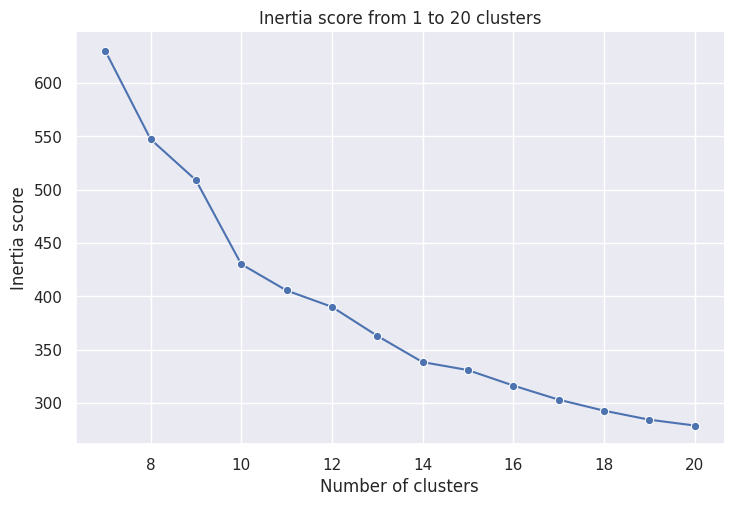

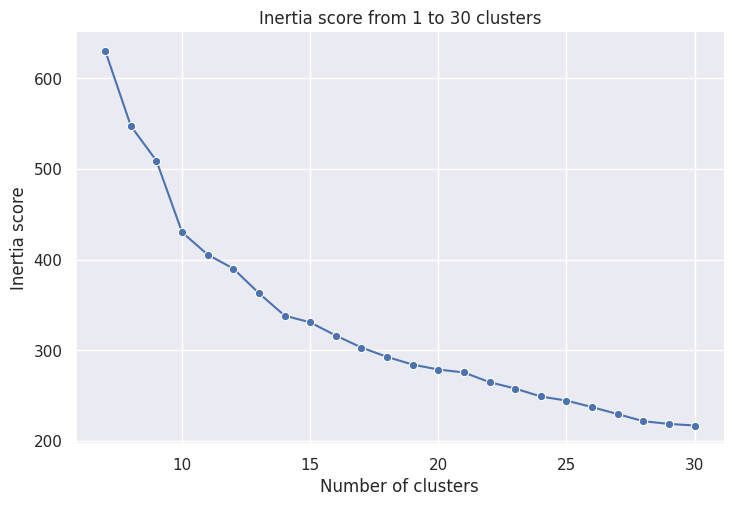

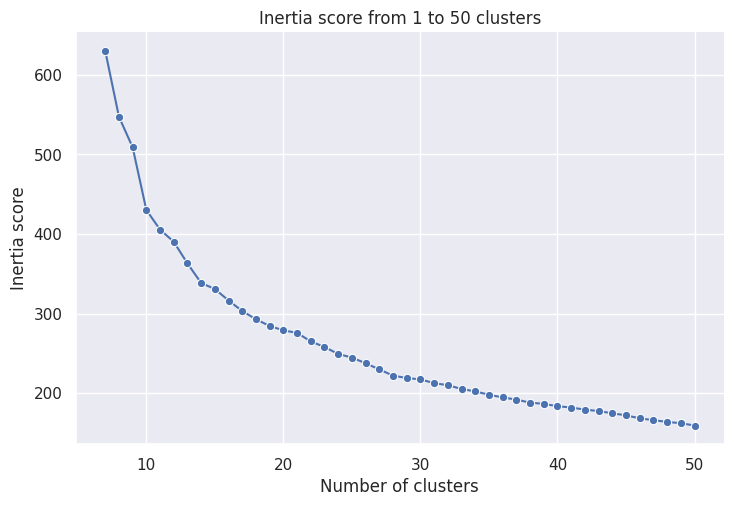

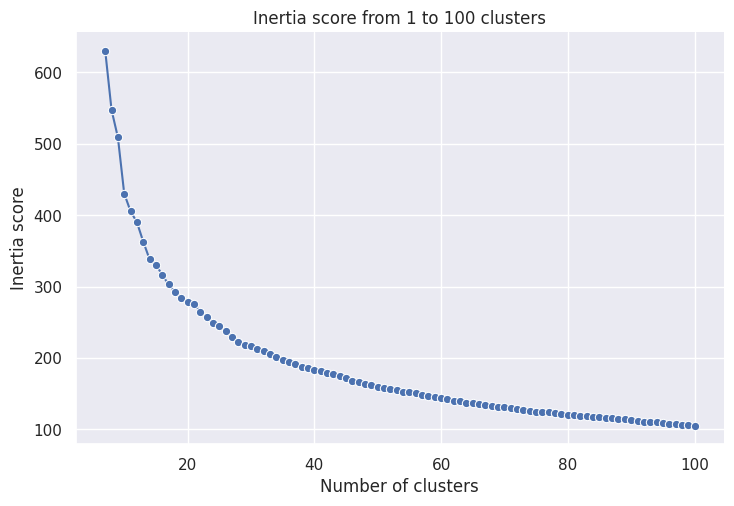

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, scores in enumerate(inertia_list_of_lists_42):
  cluster_numbers = list(range(7, len(scores) + 7))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (sns.relplot(
      y = scores,
      x = cluster_numbers,
      kind = 'line',
      marker='o',
      legend=True,
      height = 5,
      aspect = 1.5
      )
  # Set the title of the plot
  .set(title=f"Inertia score from 1 to {max_k[idx]} clusters")
  # Set the axis labels
  .set_axis_labels("Number of clusters", "Inertia score")
  );

Where the elbow lies is not always clear - it's up to you to decide, you're the data scientist. If there are multiple points where you believe the elbow could be, use your knowledge of the business case to inform your decision. How many data points do you have? How many would be in a cluster if you chose this number of clusters? What is the point of making these clusters? Is there a logical number of clusters, where if you make more clusters they just become too small for your business case?
> The elbow method is a heuristic, meaning that it is not guaranteed to find the optimal number of clusters in all cases.

#### Seed = 42

In [ ]:
# Decide on a random_state to use
seed42 = 42

# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
inertia_list_of_lists_42 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  inertia_scores = []  # Temporary list to store inertia for the current range

  for i in range(1, k + 1):  # Iterate over cluster numbers

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=i, n_init="auto", random_state=seed42)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(spotify_songs_minmax)

    # Append the inertia score to the temporary list
    inertia_scores.append(kmeans_model.inertia_)

  # Append the temporary list to the list of lists
  inertia_list_of_lists_42.append(inertia_scores)

# Print the list of lists to verify
print("Inertia List of Lists:")
for idx, scores in enumerate(inertia_list_of_lists_42):
    print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Inertia List of Lists:
max_k = 20: [3196.3364885280785, 2307.612080143201, 1453.2459201306017, 1126.7233333203724, 961.5945224018674, 888.4109638696236, 748.2437738194162, 665.1627071379481, 626.8609302979506, 547.7898325630434, 516.845178322189, 500.93903752987285, 476.2874899892573, 467.0586117467758, 453.3789883322002, 429.7096685038454, 415.46416463706674, 410.09642956269136, 401.72296931786315, 396.0368331109283]
max_k = 30: [3196.3364885280785, 2307.612080143201, 1453.2459201306017, 1126.7233333203724, 961.5945224018674, 888.4109638696236, 748.2437738194162, 665.1627071379481, 626.8609302979506, 547.7898325630434, 516.845178322189, 500.93903752987285, 476.2874899892573, 467.0586117467758, 453.3789883322002, 429.7096685038454, 415.46416463706674, 410.09642956269136, 401.72296931786315, 396.0368331109283, 378.81458483878436, 375.8157625830162, 365.602597499909, 357.9995742981099, 353.5293052284

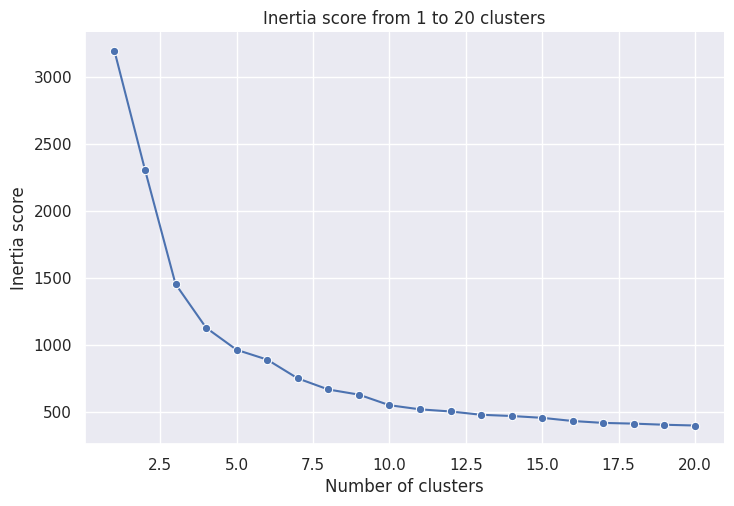

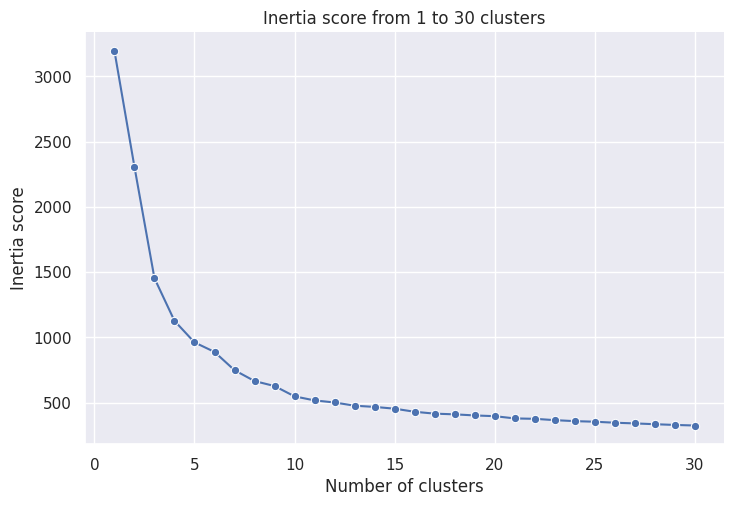

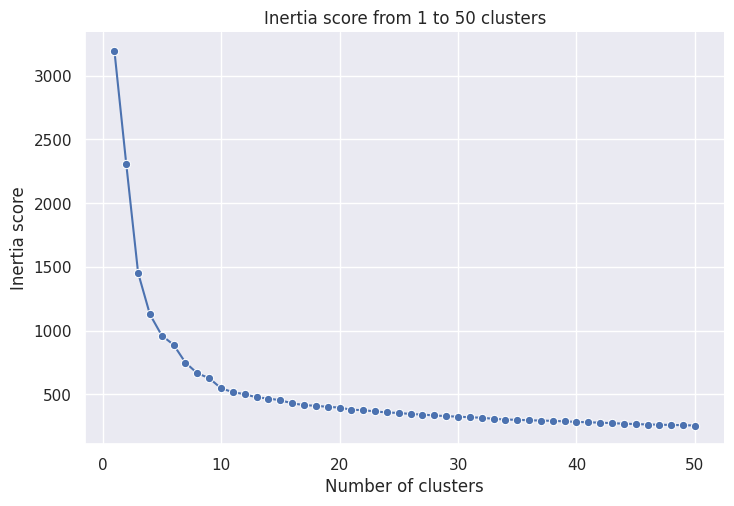

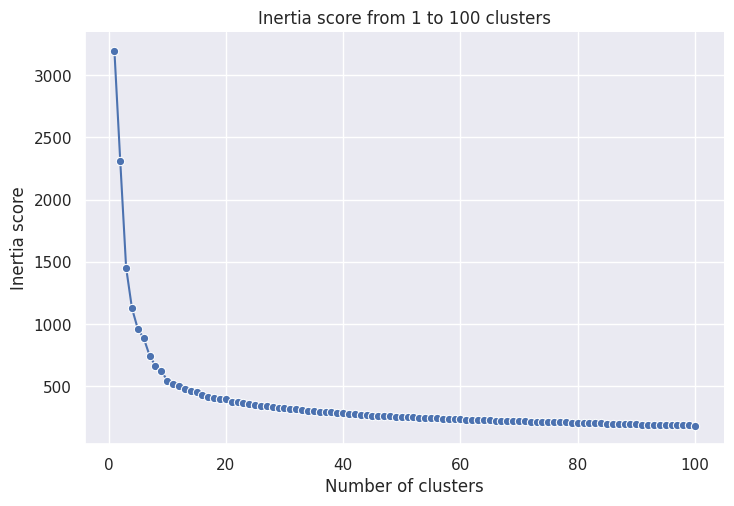

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, scores in enumerate(inertia_list_of_lists_42):
  cluster_numbers = list(range(1, len(scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (sns.relplot(
      y = scores,
      x = cluster_numbers,
      kind = 'line',
      marker='o',
      legend=True,
      height = 5,
      aspect = 1.5
      )
  # Set the title of the plot
  .set(title=f"Inertia score from 1 to {max_k[idx]} clusters")
  # Set the axis labels
  .set_axis_labels("Number of clusters", "Inertia score")
  );

Where the elbow lies is not always clear - it's up to you to decide, you're the data scientist. If there are multiple points where you believe the elbow could be, use your knowledge of the business case to inform your decision. How many data points do you have? How many would be in a cluster if you chose this number of clusters? What is the point of making these clusters? Is there a logical number of clusters, where if you make more clusters they just become too small for your business case?
> The elbow method is a heuristic, meaning that it is not guaranteed to find the optimal number of clusters in all cases.

#### Seed = 143

In [ ]:
# Decide on a random_state to use
seed143 = 143

# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
inertia_list_of_lists_143 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  inertia_scores = []  # Temporary list to store inertia for the current range

  for i in range(1, k + 1):  # Iterate over cluster numbers

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=i, n_init="auto", random_state=seed143)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(spotify_songs_minmax)

    # Append the inertia score to the temporary list
    inertia_scores.append(kmeans_model.inertia_)

  # Append the temporary list to the list of lists
  inertia_list_of_lists_143.append(inertia_scores)

# Print the list of lists to verify
print("Inertia List of Lists:")
for idx, scores in enumerate(inertia_list_of_lists_143):
    print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Inertia List of Lists:
max_k = 20: [3196.3364885280785, 2307.612080143201, 1453.5148686345535, 1126.7233239272819, 1053.5518747375065, 899.0463945656977, 748.2254311919588, 655.0417177920957, 586.0887541995316, 560.8591388811286, 530.7205523894992, 492.44805097660026, 468.2827331610207, 458.142987895061, 442.22992892102303, 430.4136288148968, 417.57336788750695, 402.7995733725513, 394.8054315945575, 386.44730019374697]
max_k = 30: [3196.3364885280785, 2307.612080143201, 1453.5148686345535, 1126.7233239272819, 1053.5518747375065, 899.0463945656977, 748.2254311919588, 655.0417177920957, 586.0887541995316, 560.8591388811286, 530.7205523894992, 492.44805097660026, 468.2827331610207, 458.142987895061, 442.22992892102303, 430.4136288148968, 417.57336788750695, 402.7995733725513, 394.8054315945575, 386.44730019374697, 379.8383667999713, 373.1585016310101, 362.9272409863027, 359.64432160889874, 353.3627596

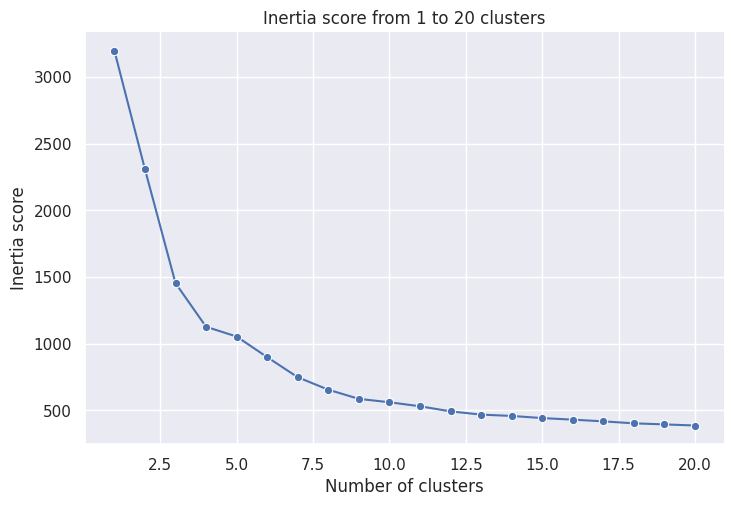

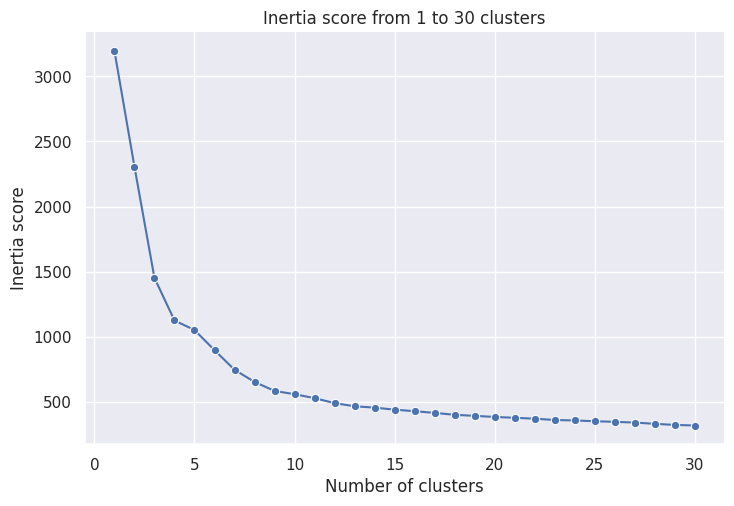

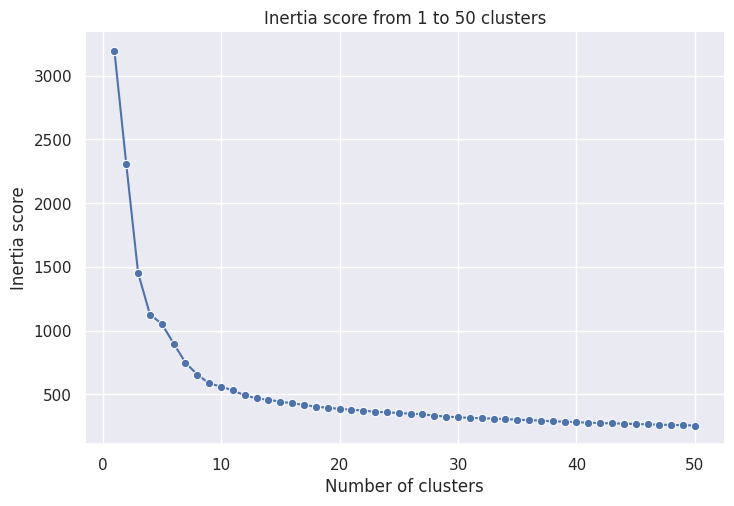

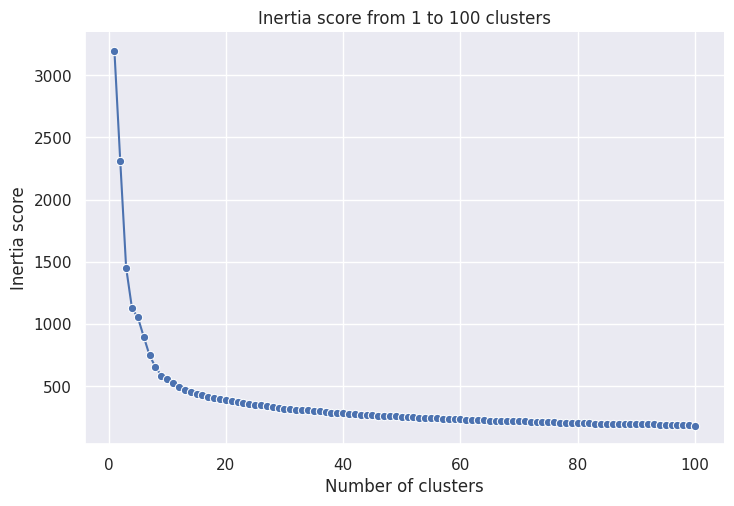

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, scores in enumerate(inertia_list_of_lists_143):
  cluster_numbers = list(range(1, len(scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (sns.relplot(
      y = scores,
      x = cluster_numbers,
      kind = 'line',
      marker='o',
      legend=True,
      height = 5,
      aspect = 1.5
      )
  # Set the title of the plot
  .set(title=f"Inertia score from 1 to {max_k[idx]} clusters")
  # Set the axis labels
  .set_axis_labels("Number of clusters", "Inertia score")
  );

#### seed = 1

In [ ]:
# Decide on a random_state to use
seed1 = 1

# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
inertia_list_of_lists_1 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  inertia_scores = []  # Temporary list to store inertia for the current range

  for i in range(1, k + 1):  # Iterate over cluster numbers

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=i, n_init="auto", random_state=seed1)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(spotify_songs_minmax)

    # Append the inertia score to the temporary list
    inertia_scores.append(kmeans_model.inertia_)

  # Append the temporary list to the list of lists
  inertia_list_of_lists_1.append(inertia_scores)

# Print the list of lists to verify
print("Inertia List of Lists:")
for idx, scores in enumerate(inertia_list_of_lists_1):
    print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Inertia List of Lists:
max_k = 20: [3196.3364885280785, 2016.954914036638, 1453.5148582251784, 1126.7247724852512, 972.2182459245649, 821.3933576689184, 748.2219430772894, 655.0271806655386, 624.0790491645632, 599.6104539631991, 553.8257677669792, 545.3624155234414, 483.91153607608493, 459.9699726889533, 444.93676482148356, 435.05980092132495, 430.06024829008084, 414.37175029149347, 405.9528322248185, 396.3253221841644]
max_k = 30: [3196.3364885280785, 2016.954914036638, 1453.5148582251784, 1126.7247724852512, 972.2182459245649, 821.3933576689184, 748.2219430772894, 655.0271806655386, 624.0790491645632, 599.6104539631991, 553.8257677669792, 545.3624155234414, 483.91153607608493, 459.9699726889533, 444.93676482148356, 435.05980092132495, 430.06024829008084, 414.37175029149347, 405.9528322248185, 396.3253221841644, 383.2984130437611, 371.66412617611314, 361.29436941420266, 355.7754107079589, 349.5769

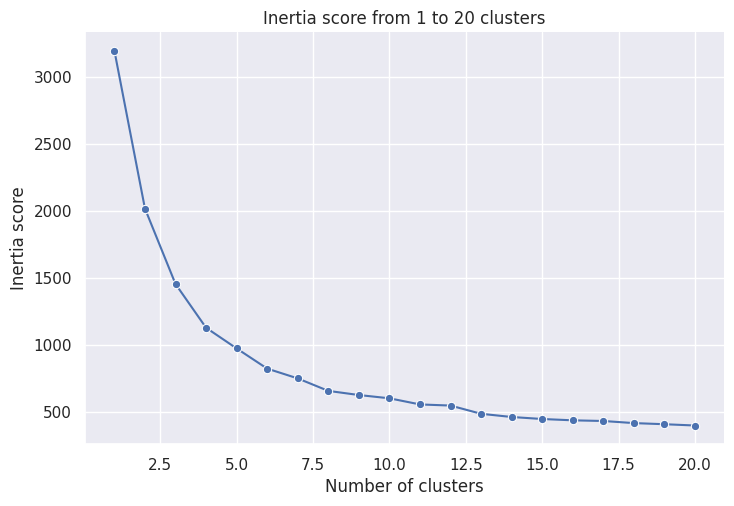

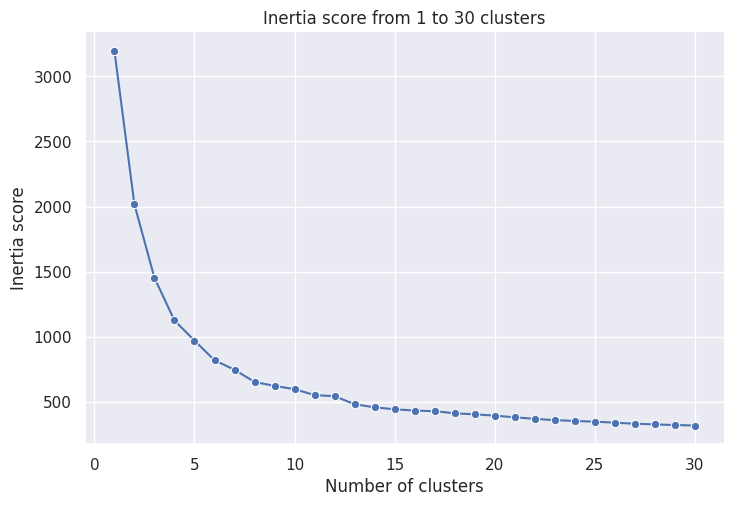

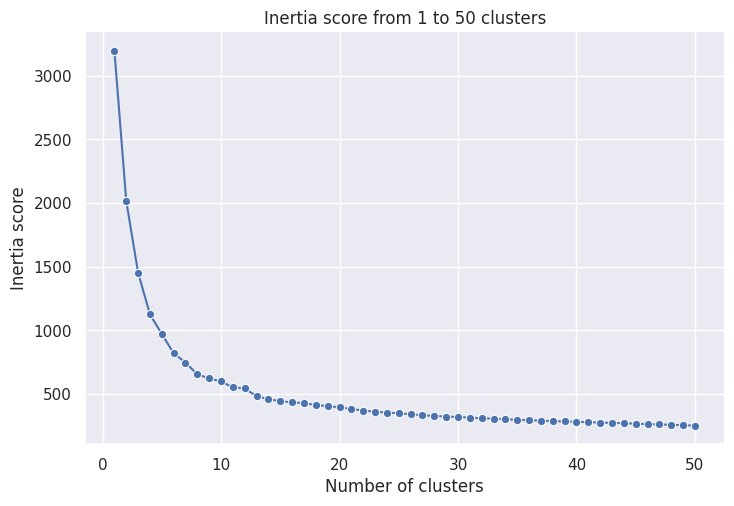

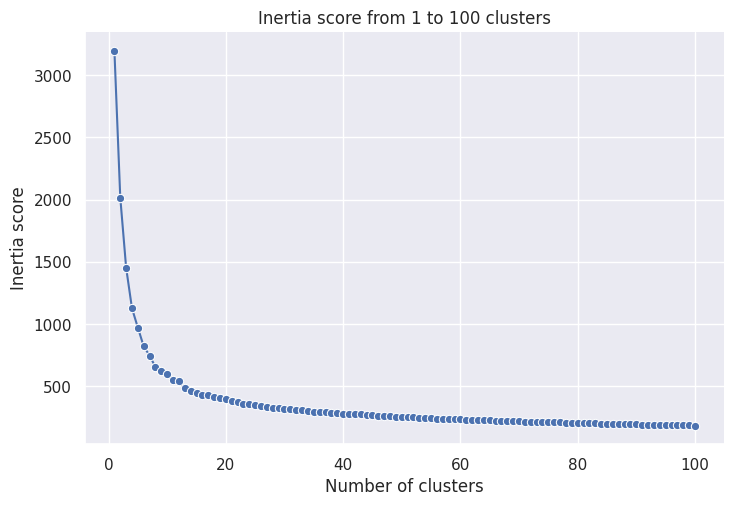

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, scores in enumerate(inertia_list_of_lists_1):
  cluster_numbers = list(range(1, len(scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (sns.relplot(
      y = scores,
      x = cluster_numbers,
      kind = 'line',
      marker='o',
      legend=True,
      height = 5,
      aspect = 1.5
      )
  # Set the title of the plot
  .set(title=f"Inertia score from 1 to {max_k[idx]} clusters")
  # Set the axis labels
  .set_axis_labels("Number of clusters", "Inertia score")
  );

In [ ]:
# Payal's code
seed = 42
# Set the maximum number of clusters to try
k_values = [20, 30, 50, 100]
inertia_with_k = {}
for max_k in k_values:
  # Create an empty list to store the inertia scores
  inertia_list = []
  # Iterate over the range of cluster numbers
  for i in range(1, max_k + 1):
      # Create a KMeans object with the specified number of clusters
      obj_KMeans = KMeans(n_clusters = i,
                          n_init = 'auto',
                        random_state = seed)
      # Fit the KMeans model to the scaled data
      obj_KMeans.fit(spotify_songs_minmax)
      # Append the inertia score to the list
      inertia_list.append(obj_KMeans.inertia_)
      #inertia_list
  inertia_with_k[max_k] = inertia_list

print(inertia_with_k)

{20: [3196.3364885280785, 2307.612080143201, 1453.2459201306017, 1126.7233333203724, 961.5945224018674, 888.4109638696236, 748.2437738194162, 665.1627071379481, 626.8609302979506, 547.7898325630434, 516.845178322189, 500.93903752987285, 476.2874899892573, 467.0586117467758, 453.3789883322002, 429.7096685038454, 415.46416463706674, 410.09642956269136, 401.72296931786315, 396.0368331109283], 30: [3196.3364885280785, 2307.612080143201, 1453.2459201306017, 1126.7233333203724, 961.5945224018674, 888.4109638696236, 748.2437738194162, 665.1627071379481, 626.8609302979506, 547.7898325630434, 516.845178322189, 500.93903752987285, 476.2874899892573, 467.0586117467758, 453.3789883322002, 429.7096685038454, 415.46416463706674, 410.09642956269136, 401.72296931786315, 396.0368331109283, 378.81458483878436, 375.8157625830162, 365.602597499909, 357.9995742981099, 353.5293052284355, 345.8821123482908, 340.6759810888829, 334.4467565867546, 328.83757266393985, 324.52713305869287], 50: [3196.3364885280785

### 3.2 The silhouette score
The silhouette score is another metric for evaluating the quality of clustering results. It measures how well each data point is assigned to its cluster, taking into account the distance to other clusters. The silhouette score ranges from -1 to 1, with higher scores indicating better clustering.

The silhouette score can be used to identify the optimal number of clusters by clustering the data with different numbers of clusters and selecting the number of clusters that has the highest the silhouette score.

To calculate the silhouette score we'll use the [SKLearn function ](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html)`silhouette_score`.

#### seed = 42

In [ ]:
seed42 = 42
# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
silhouette_list_of_lists_42 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  # Create an empty list to store the silhouette scores
  sil_scores = []

  for j in range(2, k):

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=j, n_init="auto", random_state=seed42)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(spotify_songs_minmax)

    # Get the cluster labels
    labels = kmeans_model.labels_

    # Calculate the silhouette score
    score = silhouette_score(spotify_songs_minmax, labels)

    # Append the silhouette score to the list
    sil_scores.append(score)

  # Append the temporary list to the list of lists
  silhouette_list_of_lists_42.append(sil_scores)

# Print the list of lists to verify
print("Silhouette List of Lists:")
for idx, scores in enumerate(silhouette_list_of_lists_42):
  print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Silhouette List of Lists:
max_k = 20: [0.3170897574668163, 0.4029728897949929, 0.43418305846773814, 0.4309531313349833, 0.37661025672362614, 0.3267151260833974, 0.34239023873572644, 0.3486466366519946, 0.35626553491458535, 0.3196820735063992, 0.3016150791040049, 0.29313175812582026, 0.29487612824298914, 0.2827093196154758, 0.28301211036742596, 0.28040319220920495, 0.2731715800551956, 0.2705870244741347]
max_k = 30: [0.3170897574668163, 0.4029728897949929, 0.43418305846773814, 0.4309531313349833, 0.37661025672362614, 0.3267151260833974, 0.34239023873572644, 0.3486466366519946, 0.35626553491458535, 0.3196820735063992, 0.3016150791040049, 0.29313175812582026, 0.29487612824298914, 0.2827093196154758, 0.28301211036742596, 0.28040319220920495, 0.2731715800551956, 0.2705870244741347, 0.26792145857582556, 0.24846179604567323, 0.24162882339117076, 0.23852447912750824, 0.22335159209295333, 0.2209640398661757

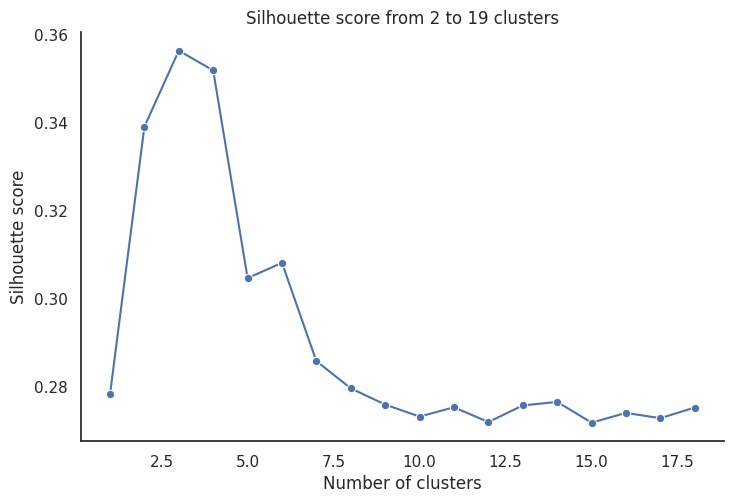

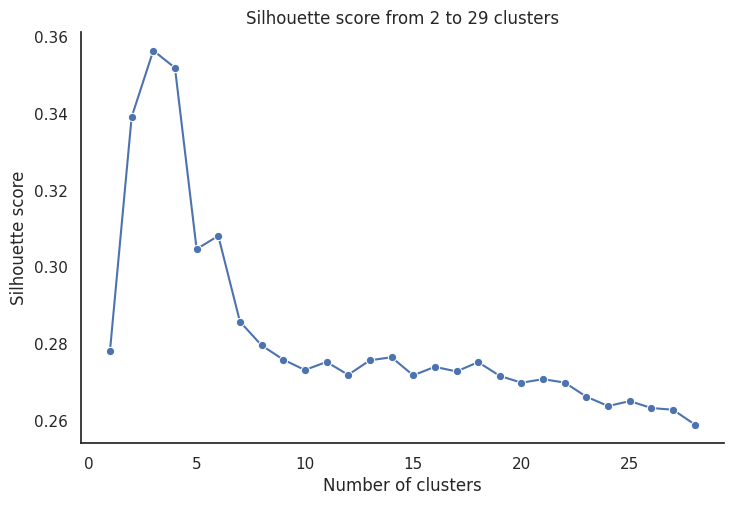

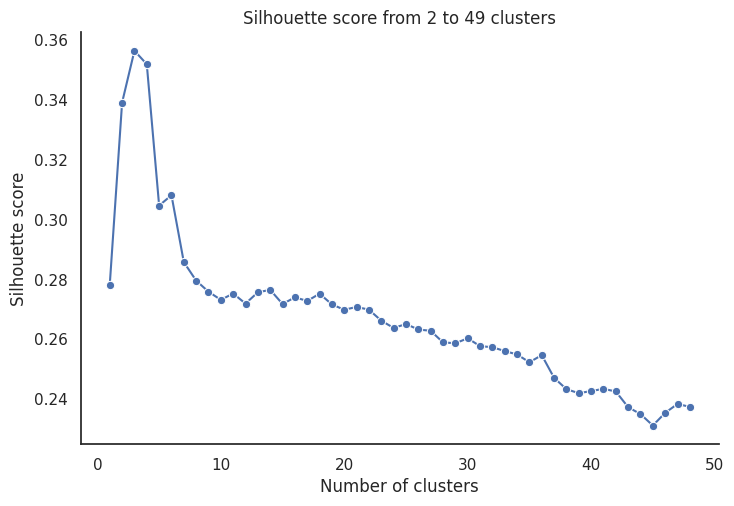

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="white")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, sil_scores in enumerate(silhouette_list_of_lists_42):
  cluster_numbers = list(range(1, len(sil_scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (
  sns.relplot(y = sil_scores,
              x = cluster_numbers,
              kind = 'line',
              marker = 'o',
              height = 5,
              aspect = 1.5)
  .set(title=f"Silhouette score from 2 to {max_k[idx] - 1} clusters")
  .set_axis_labels("Number of clusters", "Silhouette score")
  );

To determine the optimal number of clusters, we can look for the highest silhouette score. This score measures how well each point is assigned to its cluster, with higher scores indicating better clustering.

However, the highest silhouette score may not always be the best choice. For example, if the score is very high for a large number of clusters, it may be a sign that the clusters are too finely grained and that we are overfitting the data.

In addition, we should consider our business objectives and the data we are using. For example, if we are clustering customers based on their purchase history, we may want to choose a smaller number of clusters so that we can easily identify different customer segments.

Therefore, it's important to use the silhouette score in conjunction with other methods, such as the elbow method, and to consider our business objectives and the data we are using when choosing the optimal number of clusters.
> You can also experiment with different values for random_state. It's possible that you got a "bad seed" and this is leading to misleading results. Make sure to use the same random_state for both the inertia and silhouette methods so that you are comparing the same clusters.

#### seed = 143

In [ ]:
seed143 = 143
# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
silhouette_list_of_lists_143 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  # Create an empty list to store the silhouette scores
  sil_scores = []

  for j in range(2, k):

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=j, n_init="auto", random_state=seed143)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(spotify_songs_minmax)

    # Get the cluster labels
    labels = kmeans_model.labels_

    # Calculate the silhouette score
    score = silhouette_score(spotify_songs_minmax, labels)

    # Append the silhouette score to the list
    sil_scores.append(score)

  # Append the temporary list to the list of lists
  silhouette_list_of_lists_143.append(sil_scores)

# Print the list of lists to verify
print("Silhouette List of Lists:")
for idx, scores in enumerate(silhouette_list_of_lists_143):
  print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Silhouette List of Lists:
max_k = 20: [0.3170897574668163, 0.3959750232372014, 0.4341451493706301, 0.3756007473773108, 0.30473257391947434, 0.32724623062588204, 0.38717966520962, 0.3492917978642655, 0.3476556569144419, 0.307039806532056, 0.3134824406983227, 0.3091242689303387, 0.29495319369263423, 0.277140921282184, 0.2694914986624161, 0.26585724095528995, 0.2657433561580708, 0.260303290853001]
max_k = 30: [0.3170897574668163, 0.3959750232372014, 0.4341451493706301, 0.3756007473773108, 0.30473257391947434, 0.32724623062588204, 0.38717966520962, 0.3492917978642655, 0.3476556569144419, 0.307039806532056, 0.3134824406983227, 0.3091242689303387, 0.29495319369263423, 0.277140921282184, 0.2694914986624161, 0.26585724095528995, 0.2657433561580708, 0.260303290853001, 0.253129177276488, 0.2355919450537712, 0.2283289432347045, 0.23358755962304958, 0.22932274364335306, 0.21888176525669858, 0.21345288414949526

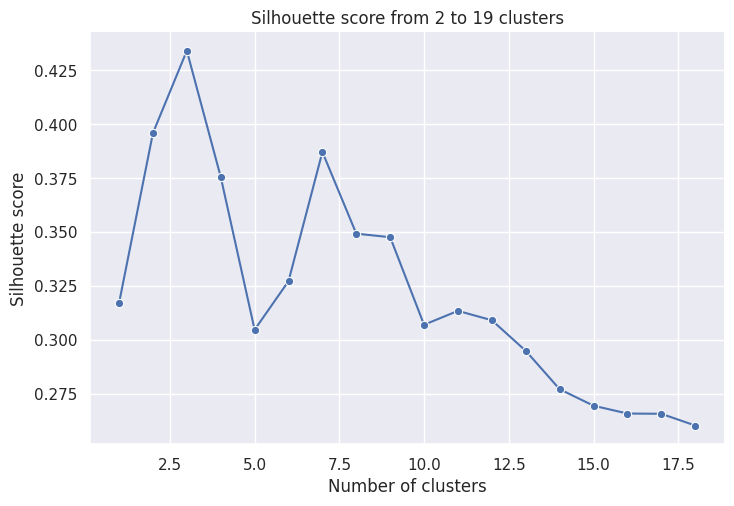

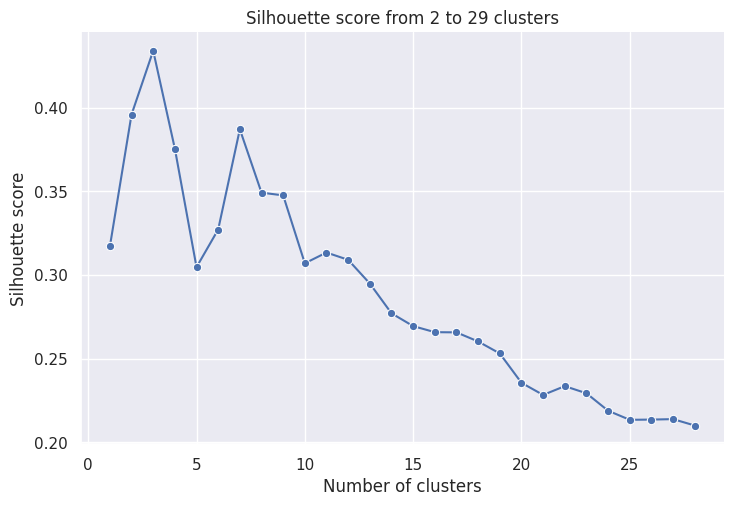

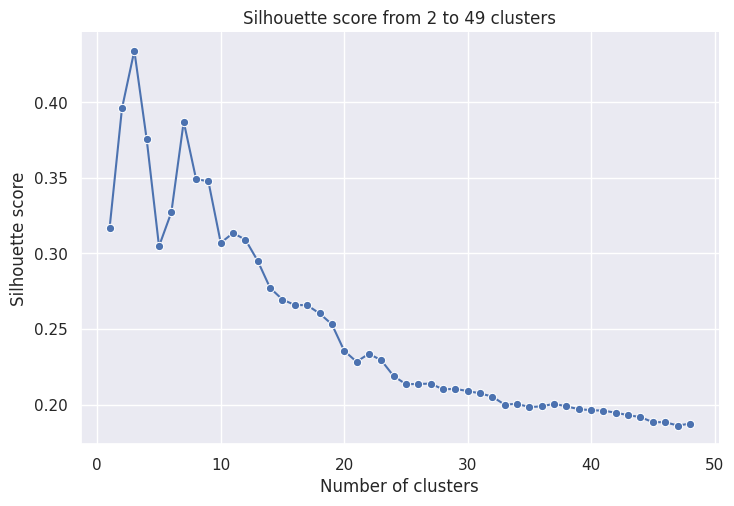

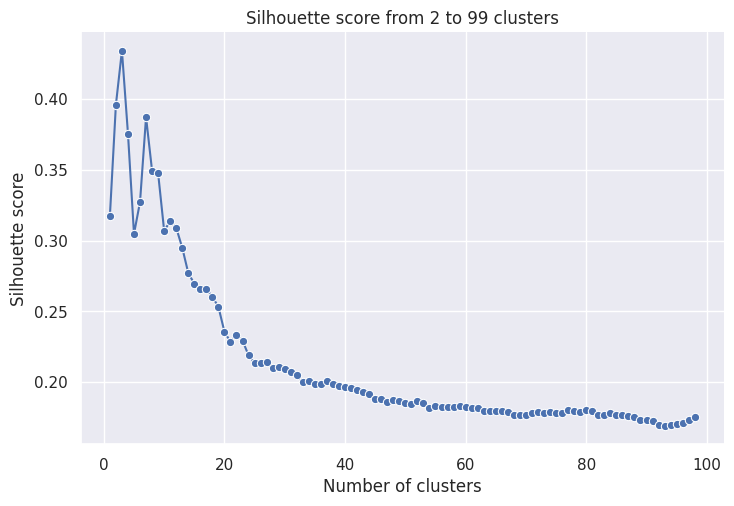

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, sil_scores in enumerate(silhouette_list_of_lists_143):
  cluster_numbers = list(range(1, len(sil_scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (
  sns.relplot(y = sil_scores,
              x = cluster_numbers,
              kind = 'line',
              marker = 'o',
              height = 5,
              aspect = 1.5)
  .set(title=f"Silhouette score from 2 to {max_k[idx] - 1} clusters")
  .set_axis_labels("Number of clusters", "Silhouette score")
  );

#### seed = 1

In [ ]:
seed1 = 1
# Set the maximum number of clusters to try
max_k = [20, 30, 50, 100]

# Create a list to store the inertia scores for each max_k
silhouette_list_of_lists_1 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  # Create an empty list to store the silhouette scores
  sil_scores = []

  for j in range(2, k):

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=j, n_init="auto", random_state=seed1)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(spotify_songs_minmax)

    # Get the cluster labels
    labels = kmeans_model.labels_

    # Calculate the silhouette score
    score = silhouette_score(spotify_songs_minmax, labels)

    # Append the silhouette score to the list
    sil_scores.append(score)

  # Append the temporary list to the list of lists
  silhouette_list_of_lists_1.append(sil_scores)

# Print the list of lists to verify
print("Silhouette List of Lists:")
for idx, scores in enumerate(silhouette_list_of_lists_1):
  print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Processing max_k = 100
Silhouette List of Lists:
max_k = 20: [0.38866530967108753, 0.39591214524700613, 0.4341451493706301, 0.35516263920648755, 0.3767015286475253, 0.3278010921524973, 0.38764427630220955, 0.34819087402884297, 0.34588635227465253, 0.3054252391758822, 0.29668466961514073, 0.3062271256955513, 0.29805429859918714, 0.2975108384311738, 0.28835736672197115, 0.2884917109001259, 0.2703149975302446, 0.2636028694982636]
max_k = 30: [0.38866530967108753, 0.39591214524700613, 0.4341451493706301, 0.35516263920648755, 0.3767015286475253, 0.3278010921524973, 0.38764427630220955, 0.34819087402884297, 0.34588635227465253, 0.3054252391758822, 0.29668466961514073, 0.3062271256955513, 0.29805429859918714, 0.2975108384311738, 0.28835736672197115, 0.2884917109001259, 0.2703149975302446, 0.2636028694982636, 0.2646163460283192, 0.247492015058162, 0.2396090818423636, 0.23676015904529518, 0.22504598607557807, 0.2236654445436761, 

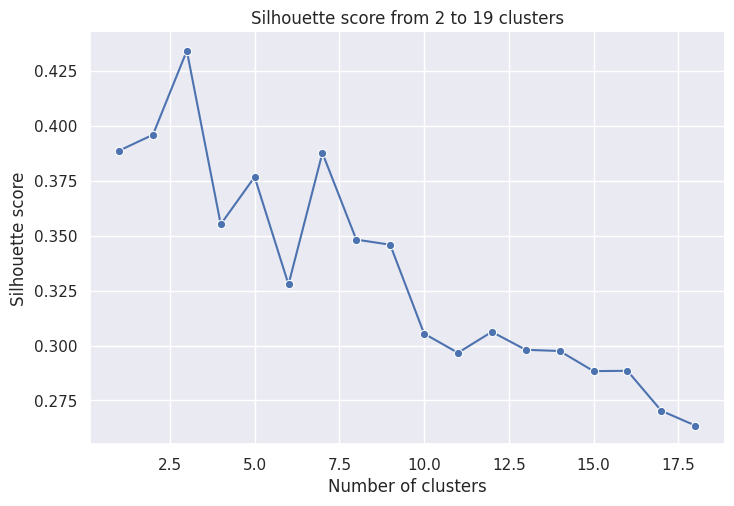

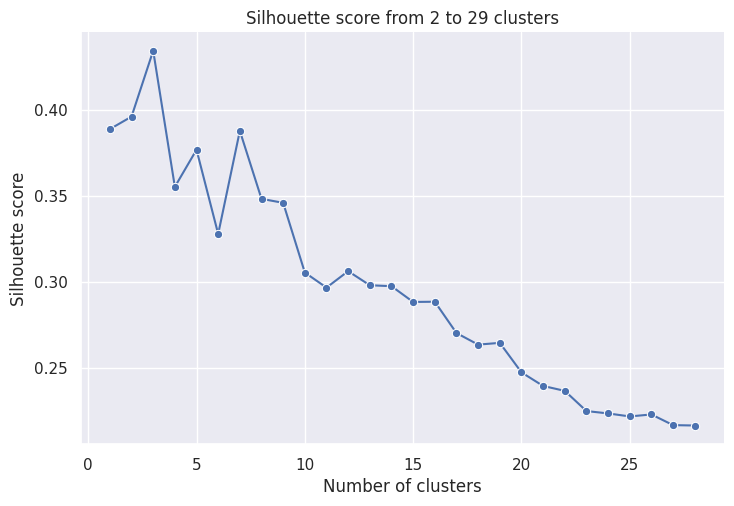

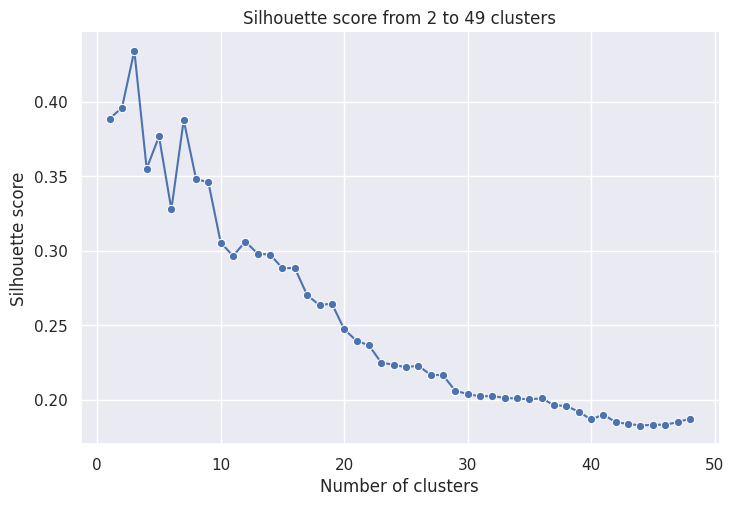

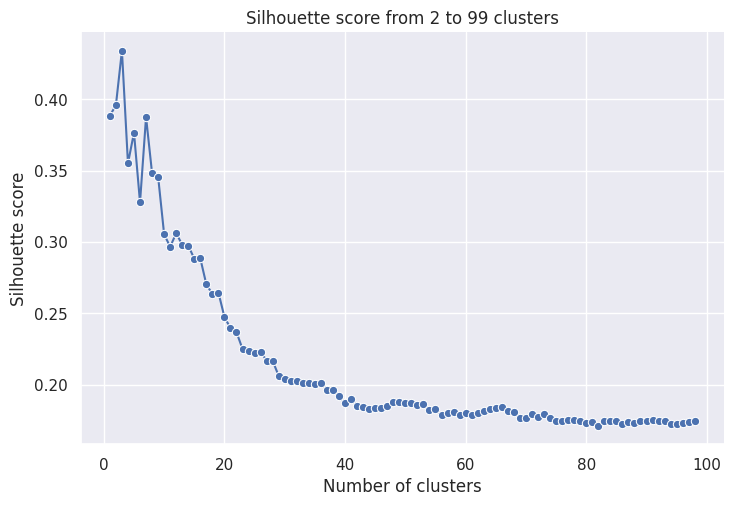

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, sil_scores in enumerate(silhouette_list_of_lists_1):
  cluster_numbers = list(range(1, len(sil_scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50, 100]
  (
  sns.relplot(y = sil_scores,
              x = cluster_numbers,
              kind = 'line',
              marker = 'o',
              height = 5,
              aspect = 1.5)
  .set(title=f"Silhouette score from 2 to {max_k[idx] - 1} clusters")
  .set_axis_labels("Number of clusters", "Silhouette score")
  );

#### seed = 42 with PCA and MinMax Scaler

In [ ]:
seed42 = 42
# Set the maximum number of clusters to try
max_k = [20, 30, 50]

# Create a list to store the inertia scores for each max_k
silhouette_list_of_lists_42 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  # Create an empty list to store the silhouette scores
  sil_scores = []

  for j in range(2, k):

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=j, n_init="auto", random_state=seed42)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(pca_variance_df)

    # Get the cluster labels
    labels = kmeans_model.labels_

    # Calculate the silhouette score
    score = silhouette_score(pca_variance_df, labels)

    # Append the silhouette score to the list
    sil_scores.append(score)

  # Append the temporary list to the list of lists
  silhouette_list_of_lists_42.append(sil_scores)

# Print the list of lists to verify
print("Silhouette List of Lists:")
for idx, scores in enumerate(silhouette_list_of_lists_42):
  print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Silhouette List of Lists:
max_k = 20: [0.3322900192151456, 0.42736287304947074, 0.44861968107680866, 0.4640337284779362, 0.41436743051438985, 0.3664059735998135, 0.3835349257579047, 0.3920451824229283, 0.4040309333598149, 0.3986983041456659, 0.37997493742592275, 0.3402453520803612, 0.33770350403923455, 0.3199582752364718, 0.3207782995871194, 0.31295293559750625, 0.31130645573035737, 0.30754333265849454]
max_k = 30: [0.3322900192151456, 0.42736287304947074, 0.44861968107680866, 0.4640337284779362, 0.41436743051438985, 0.3664059735998135, 0.3835349257579047, 0.3920451824229283, 0.4040309333598149, 0.3986983041456659, 0.37997493742592275, 0.3402453520803612, 0.33770350403923455, 0.3199582752364718, 0.3207782995871194, 0.31295293559750625, 0.31130645573035737, 0.30754333265849454, 0.2986103729769729, 0.2785386993357564, 0.27448948824110403, 0.268942715592881, 0.27315616723635205, 0.26885515676064564, 0.26431586560996106, 0.2

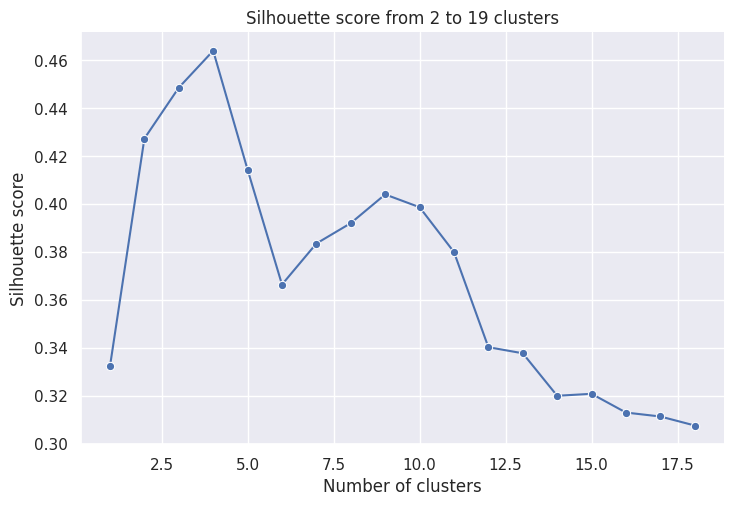

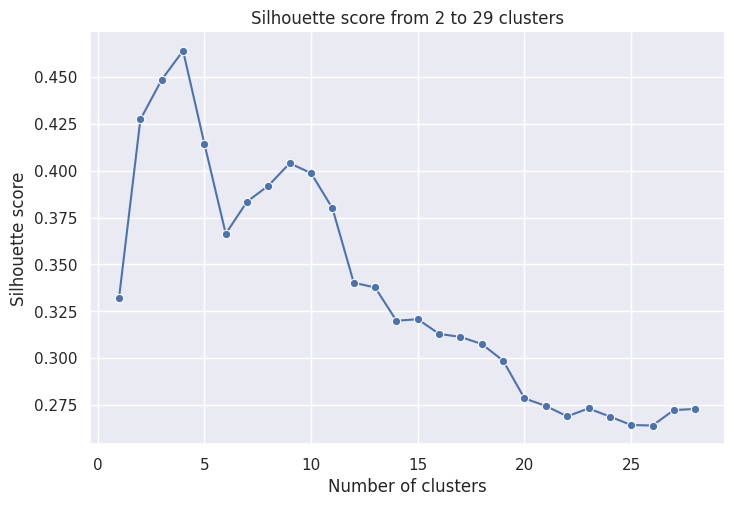

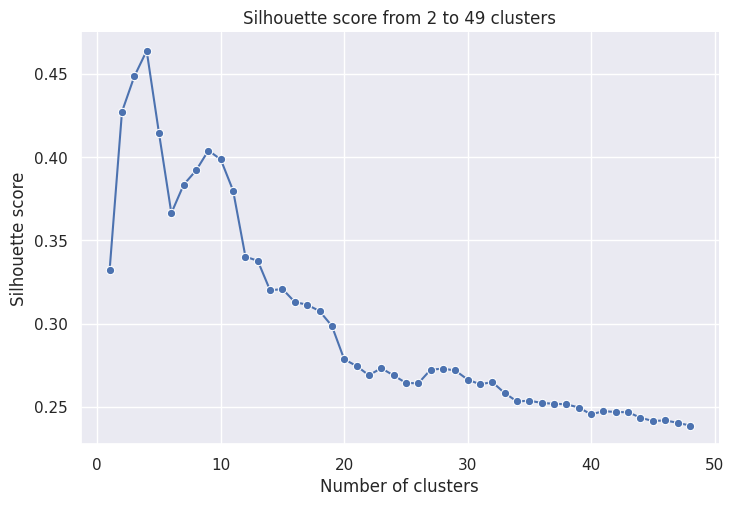

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, sil_scores in enumerate(silhouette_list_of_lists_42):
  cluster_numbers = list(range(1, len(sil_scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50]
  (
  sns.relplot(y = sil_scores,
              x = cluster_numbers,
              kind = 'line',
              marker = 'o',
              height = 5,
              aspect = 1.5)
  .set(title=f"Silhouette score from 2 to {max_k[idx] - 1} clusters")
  .set_axis_labels("Number of clusters", "Silhouette score")
  );

#### seed = 42 with PCA and quntile tranformation

In [ ]:
seed42 = 42
# Set the maximum number of clusters to try
max_k = [20, 30, 50]

# Create a list to store the inertia scores for each max_k
silhouette_list_of_lists_42 = []

# Iterate over the max_k values
for k in max_k:
  print(f"Processing max_k = {k}")

  # Create an empty list to store the silhouette scores
  sil_scores = []

  for j in range(2, k):

    # Create a KMeans object with the specified number of clusters
    kmeans_model = KMeans(n_clusters=j, n_init="auto", random_state=seed42)

    # Fit the KMeans model to the scaled data
    kmeans_model.fit(pca_variance_quantile_df)

    # Get the cluster labels
    labels = kmeans_model.labels_

    # Calculate the silhouette score
    score = silhouette_score(pca_variance_quantile_df, labels)

    # Append the silhouette score to the list
    sil_scores.append(score)

  # Append the temporary list to the list of lists
  silhouette_list_of_lists_42.append(sil_scores)

# Print the list of lists to verify
print("Silhouette List of Lists:")
for idx, scores in enumerate(silhouette_list_of_lists_42):
  print(f"max_k = {max_k[idx]}: {scores}")

Processing max_k = 20
Processing max_k = 30
Processing max_k = 50
Silhouette List of Lists:
max_k = 20: [0.27813040115314214, 0.3390839436112178, 0.356409651729896, 0.3519016587096298, 0.3046227435376305, 0.30808681086768847, 0.28571625266860584, 0.2795202363271231, 0.2758153238972849, 0.2730964627846339, 0.27520708358472973, 0.27183998059801934, 0.275625388891549, 0.27643075475428874, 0.27170709551422934, 0.27392832775217535, 0.2727227997475156, 0.2751538252634917]
max_k = 30: [0.27813040115314214, 0.3390839436112178, 0.356409651729896, 0.3519016587096298, 0.3046227435376305, 0.30808681086768847, 0.28571625266860584, 0.2795202363271231, 0.2758153238972849, 0.2730964627846339, 0.27520708358472973, 0.27183998059801934, 0.275625388891549, 0.27643075475428874, 0.27170709551422934, 0.27392832775217535, 0.2727227997475156, 0.2751538252634917, 0.2715550069696166, 0.2697819560065724, 0.27071372423007345, 0.2698029798826946, 0.2661234424388809, 0.26370091642759114, 0.26499070835859617, 0.26317

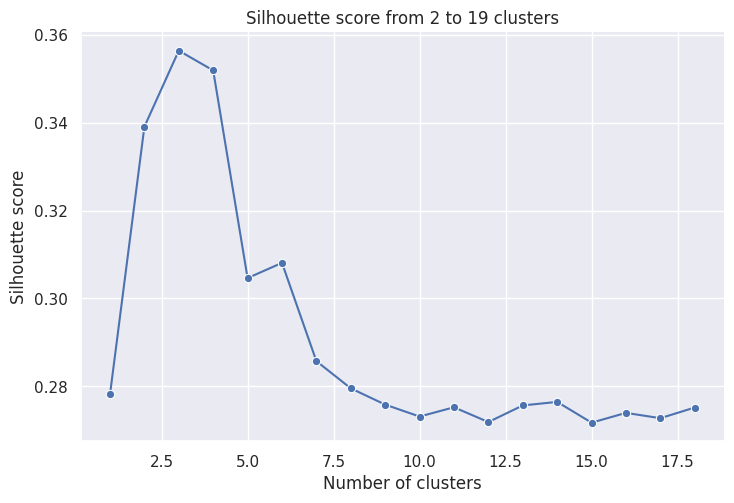

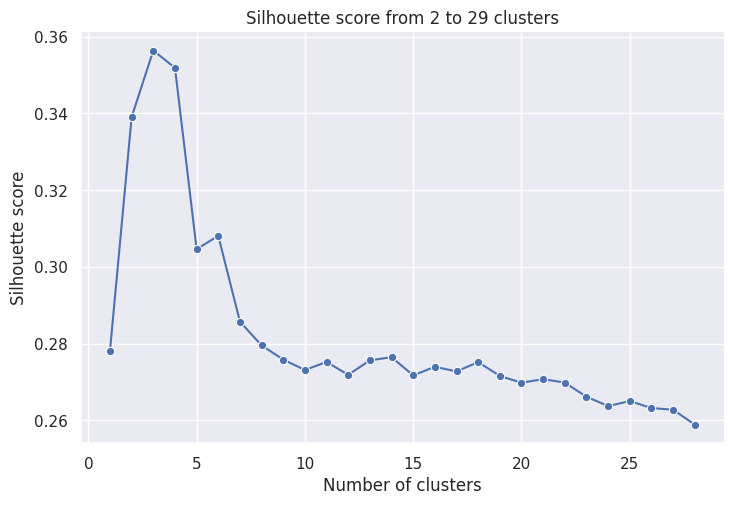

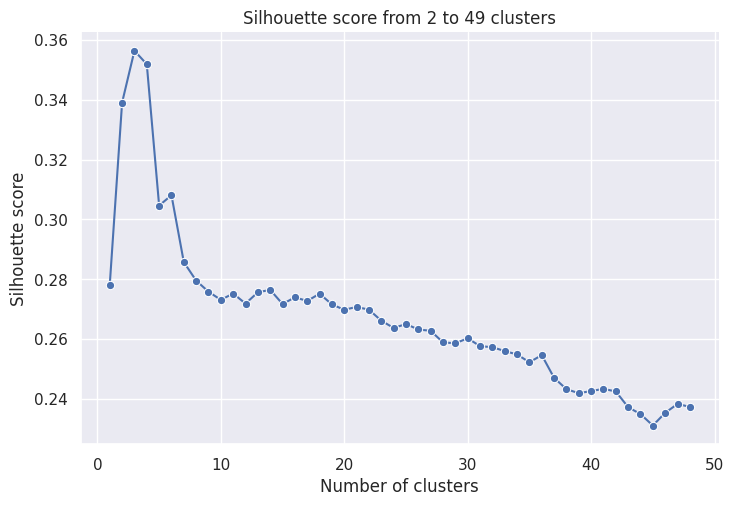

In [ ]:
# Set the Seaborn theme
sns.set_theme(style="darkgrid")

# Iterate through the inertia_list_of_lists and max_k to plot each range
for idx, sil_scores in enumerate(silhouette_list_of_lists_42):
  cluster_numbers = list(range(1, len(sil_scores) + 1))  # Cluster numbers for the current max_k i.e. [20, 30, 50]
  (
  sns.relplot(y = sil_scores,
              x = cluster_numbers,
              kind = 'line',
              marker = 'o',
              height = 5,
              aspect = 1.5)
  .set(title=f"Silhouette score from 2 to {max_k[idx] - 1} clusters")
  .set_axis_labels("Number of clusters", "Silhouette score")
  );

---
## 1.8 Explore the cluster means 🗺️

#### 4.1.&nbsp; Column averages
By grouping the clusters and looking at the average score for each column, you can learn more about the different groups of students and their food preferences. For example, you might find that one group of students prefers healthy foods like broccoli and peas, while another group prefers more processed foods like hamburgers. You might also find that some groups of students have a more diverse range of food preferences than others.

In [ ]:
# Initialise the model
my_kmeans = KMeans(n_clusters = 22, # you always choose the number of k here
                   random_state = 42)

# Fit the model to the data
my_kmeans.fit(spotify_songs_minmax)

# Obtain the cluster output
clusters = my_kmeans.labels_

# Attach the cluster output to our original DataFrame
spotify_songs_minmax["cluster"] = clusters

In [ ]:
spotify_songs_minmax.groupby(by="cluster").mean()

,danceability,energy,loudness,mode,speechiness,instrumentalness,valence,tempo
cluster,,,,,,,,
0,0.355617,0.050141,0.533504,1.0,0.052191,0.900525,0.143846,0.393754
1,0.538244,0.809641,0.877047,1.0,0.100391,0.023978,0.721655,0.719258
2,0.656997,0.406474,0.796062,0.0,0.082541,0.037473,0.626042,0.558696
3,0.329252,0.123549,0.614597,0.0,0.048880,0.888795,0.151920,0.476619
4,0.650982,0.710359,0.841443,0.0,0.072465,0.759248,0.576207,0.572241
5,0.528262,0.804024,0.847269,1.0,0.066335,0.763344,0.605183,0.602222
6,0.769932,0.718070,0.882066,0.0,0.122327,0.001901,0.550259,0.492224
7,0.385190,0.229442,0.736117,1.0,0.045407,0.043175,0.211871,0.512098
8,0.254288,0.914538,0.843007,1.0,0.117578,0.825044,0.198957,0.565145


#### 4.2.&nbsp; Radar chart
Having calculated the average score for each food by cluster, we now have a matrix that we can analyse. However, as data scientists with coding skills, we can visualise this information to gain a clearer understanding of why certain people are clustered together and why others aren't.

Visualising the data can help us to identify patterns and trends that would be difficult to see in a matrix. For example, we might be able to see that certain foods are consistently grouped together, while others are more spread out. This could suggest that there are different subgroups of students with different dietary preferences.

We can also use visualisation to identify outliers. For example, we might find a few students who have very different food preferences than the rest of the group. This could be due to a variety of factors, such as cultural background, medical conditions, or personal preferences.

In [ ]:
spotify_songs_minmax.columns

Index(['danceability', 'energy', 'loudness', 'mode', 'speechiness',
       'instrumentalness', 'valence', 'tempo', 'cluster'],
      dtype='object')

In [ ]:
# Create an empty list to store the Scatterpolar object of each cluster
scatter_objects = []

# State the label for each arm of the chart
categories = spotify_songs_minmax.columns

# Iterate over the unique clusters and add an object for each cluster to the list
for cluster in sorted(spotify_songs_minmax['cluster'].unique()):

  # Find the mean value for each column of the cluster
  cluster_means = [spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[0]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[1]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[2]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[3]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[4]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[5]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[6]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[7]].mean(),
                  spotify_songs_minmax.loc[spotify_songs_minmax["cluster"] == cluster, categories[8]].mean()]
                  # Bonus: see if you can turn this code for `cluster_means` into a list comprehension

  # Create a Scatterpolar object for the cluster
  cluster_scatter = go.Scatterpolar(
    r = cluster_means, # set the radial coordinates
    theta = categories, # the names of the columns
    fill = 'toself', # fills in the space with colour
    name = f'Cluster {cluster}' # adds the name of the cluster
  )

  # Add the Scatterpolar object to the list
  scatter_objects.append(cluster_scatter)

# Create the figure (the white area)
fig = go.Figure()

# Add the scatter objects to the figure
fig.add_traces(scatter_objects)

# Add extras to the plot, such as title
fig.update_layout(
  title_text = 'Radar chart of mean songs preferences by cluster',
  height = 600,
  width = 800,
  polar = dict(
    radialaxis = dict(
      visible = True, # visibility of the numbers on the arm
      range = [0, 1] # scale of the plot
    )),
  showlegend = True
)

# Show the initialised plot and the trace objects
fig.show()

# Findings
1. Data cleaning
    - strip white spaces from each column name
    - strip white space from song name as well
    - drop uneccessary columns such as id, html etc..
    - drop duplicates???
    - decided to use random seed = 42

2. Data update
    - Combine song_name and artist in one column as song_name_&_artist
    - set song_name_&_artist as index of dataframe
  
3. Data preprocessing
    - Testing different scalers and transformer
    - Decided to use MinMax Scaler

4. Further analysis
    - Analysing k clusters - finding the k value
    - Two methods are available for k
    
    1. For seed = 42
      1. inertia elbow method
        - k = [20, 30, 50, 100]
        - result num_cluster between 8 to 10

      2. The silhouette coefficient
        - k = [20, 30, 50, 100]
        - result = num_cluster between 8 to 11

    2. For seed = 143
      1. inertia elbow method
        - k = [20, 30, 50, 100]
        - result num_cluster between

      2. The silhouette coefficient
        - k = [20, 30, 50, 100]
    

5. PCA - cummulative method
6. again done analysing k
7. All above done with quantile transformation as well and with PCA
8. Plotting radar graph
